<a href="https://colab.research.google.com/github/MIT-HSCL/GT-Location-Selection-Model/blob/main/Brazil_GT_TC_Location_Selection_PuLP_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Sections:
- Packages and Libraries
- Upload, Define, and Process Data
- Optimization Model
- Outputs: Maps, Histograms, Printouts
  - Just maps
  - Just histograms
  - Just printouts
  - Combo maps, histograms, printouts
- Calling functions to generate results




Packages and Libraries

In [ ]:
# Install packages
!pip install pulp
!pip install geobr
!pip install geopy
!pip install unidecode
!pip install descartes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.7/17.7 MB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 53.1 MB/s eta 0:00:00
  Attempting uninstall: shapely
    Found existing installation: shapely 2.0.4
    Uninstalling shapely-2.0.4:
      Successfully uninstalled shapely-2.0.4
  Attempting uninstall: lxml
    Found existing installation: lxml 4.9.4
    Uninstalling lxml-4.9.4:
      Successfully uninstalled lxml-4.9.4
  Attempting uninstall: geopandas
    Found existing installation: geopandas 0.13.2
    Uninstalling geopandas-0.13.2:
      Successfully uninstalled geopandas-0.13.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.5/235.5 kB 5.1 MB/s eta 0:00:00


In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import pulp as pulp # for modeling and solving optimization
from scipy.spatial.distance import cdist # for calculating distances between many points
import matplotlib.pyplot as plt # for visualizing with plots
from google.colab import files # for uploading files to colab
import geopandas as geopandas # for reading and plotting maps
import unidecode # for helping Python merge data sources with different accents on place names
from decimal import *
from math import floor
from math import ceil
from bisect import bisect_left # binary search for histogram creation function
import warnings

# Brazil specific
import geobr as geobr # Brazil state and municipality shapes
import geopy.distance as geopy_distance # see https://github.com/geopy/geopy/issues/347

Upload, Define, and Process Data

In [ ]:
# Mount colab notebook to Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Add directory path to get to data files in your Drive
# Sarah's path:
%cd /content/drive/MyDrive/TPP Research/Roche/Models/Working Brazil PuLP Model and Data

/content/drive/MyDrive/TPP Research/Roche/Models/Working Brazil PuLP Model and Data


In [ ]:
# Alternatively, upload files from computer
# # Upload center candidate csv's
# uploaded = files.upload()

In [ ]:
# # Upload starting points csv
# uploaded = files.upload()

In [ ]:
# # Upload municipality population csv
# uploaded = files.upload()

In [ ]:
# # Upload state population csv
# uploaded = files.upload()

In [ ]:
# Sources of candidate treatment center locations:
top_15_cities_tc_filename = "Brazil Gene Therapy Center Candidates - Top 15 Cities.csv"
main_4_cities_tc_filname = "Brazil Gene Therapy Center Candidates - 4 Main Cities.csv"
biggest_city_every_state_tc_filename = "Brazil Gene Therapy Center Candidates - Biggest City in Every State.csv"
reference_center_cities_tc_filename = "Brazil Gene Therapy Center Candidates - Reference Center Cities.csv"
prev_gene_therapy_tc_filename = "Brazil Gene Therapy Center Candidates - Previous Gene Therapy.csv"

In [ ]:
# Starting points filename:
starting_points_filename = "Brazil Starting Points - Sheet1.csv"

In [ ]:
# Population filenames:
states_population_filename = "POP2022_Brasil_e_UFs - BRASIL E UFs.csv"
municipalities_population_filename = "POP2022_Municipios_20230622.csv"

In [ ]:
def process_treatment_center_data(filename):
  '''Takes in name of file with unprocessed treatment center data.
  Returns processed DataFrame.
  filename: name of csv file to read in. '''
  treatment_centers = pd.read_csv(filename)
  treatment_centers.set_index(treatment_centers.index + 1, inplace=True)
  treatment_centers.index = 'TC' + treatment_centers.index.astype(str)
  return treatment_centers

In [ ]:
# Example usage:
treatment_centers = process_treatment_center_data(main_4_cities_tc_filname)
treatment_centers

,City,Region,Latitude,Longitude
TC1,São Paulo,São Paulo,-23.557762,-46.633308
TC2,Rio de Janeiro,Rio de Janeiro,-22.903671,-43.131564
TC3,Salvador,Bahia,-12.975194,-38.481333
TC4,Belo Horizonte,Minas Gerais,-19.920072,-43.939347


In [ ]:
def process_brazilian_census_patient_population_data(granularity):
  """Takes in desired granularity of Brazilian patient population data and returns processed DataFrame.
  granularity: "state" or "municipality"

  Long runtime due to geobr API calls. """
  if granularity == "state":
    patient_populations = pd.read_csv("POP2022_Brasil_e_UFs - BRASIL E UFs.csv", header=1)
    patient_populations.drop([0, 1, 9, 19, 24, 28, 33, 34], inplace=True) # these are rows with regional totals, country totals, & a footnote
    patient_populations.reset_index(inplace=True)
    patient_populations.set_index(patient_populations.index + 1, inplace=True)
    patient_populations.drop(columns=['Unnamed: 1', 'index'], inplace=True)
    patient_populations.index = 'R' + patient_populations.index.astype(str)

    # Add a lower case column to merge on because the geobr database was capitalizing 'do' and 'de'
    #   in Rio Grande do Norte, Rio De Janeiro, Rio Grande Do Sul, and Mato Grosso Do Sul
    patient_populations['merge_on'] = patient_populations['BRASIL E UNIDADES DA FEDERAÇÃO'].str.lower().apply(unidecode.unidecode)
    patient_populations['population'] = patient_populations['POPULAÇÃO'].str.replace(',', '')
    patient_populations['population'] = patient_populations['population'].astype(int)

    # Get Brazilian state shapes in geoDataFrame from geobr
    states = geobr.read_state(year=2020) # 2020 is the most recent option available (as of Sep. 27, 2023)

    # Add a lower case column to merge on because the geobr database was capitalizing 'do' and 'de'
    #   in Rio Grande do Norte, Rio De Janeiro, Rio Grande Do Sul, and Mato Grosso Do Sul
    states['merge_on'] = states['name_state'].str.lower().apply(unidecode.unidecode)
    patient_population_states = pd.merge(states, patient_populations, on='merge_on') # for some reason the .centroid in the next line doesn't work
                                                      # if I switch the merge order. Likely some datatype shifting happening under the scenes.

    # Starting with geometric centroids, then think about population centroids
    # WARNING: This will affect results in non-intended ways
    # Geometric centroids as my coordinates for patient populations
    patient_population_states["centroid"] = patient_population_states["geometry"].centroid
    patient_population_states["centroid_long"] = patient_population_states["centroid"].values.x
    patient_population_states["centroid_lat"] = patient_population_states["centroid"].values.y
    patient_population_states.index = patient_population_states.index.astype(int) + 1
    patient_population_states.index = 'R' + patient_population_states.index.astype(str)
    return patient_population_states

  elif granularity == "municipality":
    patient_populations = pd.read_csv("POP2022_Municipios_20230622.csv", header=1) # header 1, as 0 is a title
    patient_populations.drop(patient_populations.index[5570:5605], inplace=True) # Removes footnotes at the bottom
    patient_populations.reset_index(inplace=True)
    patient_populations.set_index(patient_populations.index + 1, inplace=True)
    patient_populations.drop(columns=['index'], inplace=True)
    patient_populations.index = 'R' + patient_populations.index.astype(str)

    # Clean population column
    patient_populations['population'] = patient_populations[' POPULAÇÃO '].str.replace(',', '') # Removes commas
    patient_populations['population'] = patient_populations['population'].str.replace('\.', '', regex=True) # Removes periods
    patient_populations['population'] = patient_populations['population'].str.replace('\(.\)', '', regex=True) # Removes footnote references e.g. (1)
    patient_populations['population'] = patient_populations['population'].str.replace('\(..\)', '', regex=True) # Removes footnote references e.g. (11)
    patient_populations['population'] = patient_populations['population'].astype(int)

    # Get Brazilian municipality shapes in geoDataFrame from geobr
    municipalities = geobr.read_municipality(year=2022) # 2022 is the most recent option available (as of Feb. 27, 2023)
    municipalities['municipal_code'] = municipalities['code_muni']

    # Join on municipality code
    patient_populations['municipal_code'] = patient_populations['COD. UF']*100000 + patient_populations['COD. MUNIC']
    patient_population_municipalities = pd.merge(municipalities, patient_populations, on='municipal_code', indicator=True, how='outer')
    patient_population_municipalities.at[4606, 'population'] = 0 # Lagoa Mirim, literal lagoon
    patient_population_municipalities.at[4607, 'population'] = 0 # Lagoa dos Patos, literal lagoon

    # Geometric centroids as coordinates for patient populations
    patient_population_municipalities["centroid"] = patient_population_municipalities["geometry"].centroid
    patient_population_municipalities["centroid_long"] = patient_population_municipalities["centroid"].values.x
    patient_population_municipalities["centroid_lat"] = patient_population_municipalities["centroid"].values.y
    patient_population_municipalities.index = patient_population_municipalities.index.astype(int) + 1
    patient_population_municipalities.index = 'R' + patient_population_municipalities.index.astype(str)

    return patient_population_municipalities

  else:
    raise ValueError("Only handes 'state' and 'municipality' level population requests.")


In [ ]:
# Example usage:
patient_populations = process_brazilian_census_patient_population_data("state")
patient_populations

<ipython-input-86-8fbb8de1c690>:32: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  patient_population_states["centroid"] = patient_population_states["geometry"].centroid


,code_state,abbrev_state,name_state,code_region,name_region,geometry,merge_on,BRASIL E UNIDADES DA FEDERAÇÃO,POPULAÇÃO,population,centroid,centroid_long,centroid_lat
R1,11.0,RO,Rondônia,1.0,Norte,"MULTIPOLYGON (((-65.38150 -10.42907, -65.38013...",rondonia,Rondônia,"1,616,379",1616379,POINT (-62.84198 -10.91322),-62.841977,-10.913217
R2,12.0,AC,Acre,1.0,Norte,"MULTIPOLYGON (((-71.07772 -9.82774, -71.07817 ...",acre,Acre,"829,780",829780,POINT (-70.47293 -9.21327),-70.472930,-9.213271
R3,13.0,AM,Amazônas,1.0,Norte,"MULTIPOLYGON (((-69.83766 -3.68659, -69.82555 ...",amazonas,Amazonas,"3,952,262",3952262,POINT (-64.65309 -4.15410),-64.653095,-4.154096
R4,14.0,RR,Roraima,1.0,Norte,"MULTIPOLYGON (((-63.96008 2.47313, -63.96041 2...",roraima,Roraima,"634,805",634805,POINT (-61.39191 2.08271),-61.391906,2.082711
R5,15.0,PA,Pará,1.0,Norte,"MULTIPOLYGON (((-51.43248 -0.47334, -51.42949 ...",para,Pará,"8,442,962",8442962,POINT (-53.07149 -3.98042),-53.071488,-3.980420
R6,16.0,AP,Amapá,1.0,Norte,"MULTIPOLYGON (((-50.45011 2.10924, -50.44715 2...",amapa,Amapá,"774,268",774268,POINT (-51.96202 1.44746),-51.962021,1.447462
R7,17.0,TO,Tocantins,1.0,Norte,"MULTIPOLYGON (((-48.23291 -5.94757, -48.23163 ...",tocantins,Tocantins,"1,584,306",1584306,POINT (-48.33130 -10.14808),-48.331299,-10.148076
R8,21.0,MA,Maranhão,2.0,Nordeste,"MULTIPOLYGON (((-44.96620 -1.27114, -44.96081 ...",maranhao,Maranhão,"6,800,605",6800605,POINT (-45.28777 -5.07221),-45.287773,-5.072211
R9,22.0,PI,Piauí,2.0,Nordeste,"MULTIPOLYGON (((-42.91509 -6.64795, -42.91636 ...",piaui,Piauí,"3,270,174",3270174,POINT (-42.97045 -7.38930),-42.970450,-7.389304
R10,23.0,CE,Ceará,2.0,Nordeste,"MULTIPOLYGON (((-41.18292 -4.01797, -41.18552 ...",ceara,Ceará,"8,936,431",8936431,POINT (-39.61579 -5.09322),-39.615789,-5.093221


In [ ]:
def process_start_point_data(filename, index=None):
  """Processes csv of treatment start points.
  index: (String) "S" + "x" where "x" is a row (1-indexed).
  Returns df with indexed start point only, if index is specified, otherwise returns a df with all start points. """
  starting_points = pd.read_csv(filename)
  starting_points.index = starting_points.index.astype(int) + 1
  starting_points.index = 'S' + starting_points.index.astype(str)

  if index:
    current_start_point = starting_points[starting_points.index == index]
    return current_start_point
  else:
    return starting_points

In [ ]:
# Read in treatment starting point data
starting_points = process_start_point_data("Brazil Starting Points - Sheet1.csv")
starting_points

,Starting point,Latitude,Longitude,Name
S1,S1,-23.420139,-46.479953,São Paulo-Guarulhos International Airport
S2,S2,-16.820979,-49.225198,DHL Logístics- Aparecida de Goiânia


In [ ]:
# Define HIGH, MEDIUM, and LOW cost parameters
patient_travel_costs_per_unit_dist = {"HIGH": 20, "MEDIUM": 4, "LOW": 2}
treatment_transport_costs_per_unit_dist = {"HIGH": 10, "MEDIUM": 2, "LOW": 1}
costs_per_treatment_center = {"HIGH": 500000, "MEDIUM": 100000, "LOW": 50000}

In [ ]:
# Defining the five approaches to choosing treatment centers:
centralize = {"tc_filename": top_15_cities_tc_filename,
              "patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["LOW"],
              "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["MEDIUM"],
              "cost_per_treatment_center": costs_per_treatment_center["HIGH"],
              "title": "Centralize"}
copy_other_gene_therapies = {"tc_filename": prev_gene_therapy_tc_filename,
                             "patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["MEDIUM"],
                             "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["MEDIUM"],
                             "cost_per_treatment_center": costs_per_treatment_center["LOW"],
                             "title": "Copy Prev Therapy"}
early_adopting_physicians = {"tc_filename": main_4_cities_tc_filname,
                             "patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["MEDIUM"],
                             "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["MEDIUM"],
                             "cost_per_treatment_center": costs_per_treatment_center["MEDIUM"],
                             "title": "Early Physicians"}
government_instruction = {"tc_filename": reference_center_cities_tc_filename,
                          "patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["HIGH"],
                          "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["LOW"],
                          "cost_per_treatment_center": costs_per_treatment_center["MEDIUM"],
                          "title": "Government"}
patient_centric = {"tc_filename": biggest_city_every_state_tc_filename,
                   "patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["HIGH"],
                   "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["LOW"],
                   "cost_per_treatment_center": costs_per_treatment_center["LOW"],
                   "title": "Patient Travel Focus"}

In [ ]:
# Define levels to compare
all_high = {"patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["HIGH"],
            "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["HIGH"],
            "cost_per_treatment_center": costs_per_treatment_center["HIGH"],
            "title": "All high"}
all_medium = {"patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["MEDIUM"],
              "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["MEDIUM"],
              "cost_per_treatment_center": costs_per_treatment_center["MEDIUM"],
              "title": "All medium"}
all_low = {"patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["LOW"],
           "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["LOW"],
           "cost_per_treatment_center": costs_per_treatment_center["LOW"],
           "title": "All low"}

In [ ]:
# Define focuses to compare
patient_travel_focused = {"patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["HIGH"],
                          "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["LOW"],
                          "cost_per_treatment_center": costs_per_treatment_center["LOW"],
                          "title": "Patient Focus"}
treatment_transport_focused = {"patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["LOW"],
                               "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["HIGH"],
                               "cost_per_treatment_center": costs_per_treatment_center["LOW"],
                               "title": "Treatment Focus"}
center_fixed_cost_focused = {"patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["LOW"],
                             "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["LOW"],
                             "cost_per_treatment_center": costs_per_treatment_center["HIGH"],
                             "title": "Center Focus"}

Optimization Model

In [ ]:
DMD_incidence_in_general_population = 2.8/100000 # 2.8 cases for every 100,000 people
fraction_of_DMD_patients_to_treat = (1/5) * (1/2) # a fifth, because only treating certain age bracket, times one half, for the diagnosis gap

In [ ]:
def run_pulp_optimization_model(starting_points, treatment_center_candidates, patient_populations, patient_travel_cost_per_unit_dist,
                           treatment_transport_cost_per_unit_dist, cost_per_treatment_center, capacity_constraint=None, title=None, unit_dist="km"):
  """Run optimization model that chooses which treatment centers to open and assigns each patient to an open center, while minmizing total cost.
  Fixed parameters: DMD prevalence rate (DMD_incidence_in_general_population), and
                    fraction of DMD patients that can be treated by this therapy (fraction_of_DMD_patients_to_treat).

  Parameters:
    starting_points: (pandas df) each row is an allowed starting point for the treatment, contains 'Latitude' and 'Longitude' columns.
    treatment_center_candidates: (pandas df) each row is a potential treatment center location, contains 'Latitude' and 'Longitude' columns.
    patient_populations: (pandas df) each row is a group of patients from an area, contains 'centroid_lat', 'centroid_long', and 'population' columns.
    patient_travel_cost_per_unit_dist: (int or float) cost associated with a patient being each 'unit_dist' away from their assigned treatment center.
    treatment_transport_cost_per_unit_dist: (int or float) cost associated with a treatment needing to be transported each 'unit_dist' from start
                                            point to treatment center.
    cost_per_treatment_center: (int or float) cost associated with opening each treatment center.
    capacity_constraint: (None or int) max patient capacity of a single treatment center. If None, no capacity limits.
    title: (None or string) Title for this set of inputs. To later be used on graphs.
    unit_dist: ("km") unit of distance used in calculations.

  Returns:
    output dictionary as follows:
    {"title": (None or float) Title given for this set of inputs (to later be used on graphs),
    "distances_pop2tc": (pandas df) matrix of the distances between patient populations (rows) and treatment centers (columns),
    "patients": (float) estimated number of patients,
    "opt_status": (string) status of the optimization, ex: "Optimal",
    "total_cost": (float) sum total cost of patient travel, treatment transport, and center fixed costs,
    "open_treatment_centers": (pandas df) open treatment centers (with locations),
    "num_centers_opened": (int) number of treatment centers opened,
    "avg_patient_travel_dist": (float) average distance patients traveled to their assigned centers,
    "avg_treatment_transport_dist": (float) average distance treatment needed to be transported from closest start point to treatment center,
    "patient_travel_costs": (float) subtotal cost of all patient travel,
    "treatment_transportation_costs": (float) subtotal cost of all treatment transportation,
    "treatment_center_fixed_costs": (float) subtotal cost of treatment center fixed costs,
    "patient_assignments": (pandas df) matrix of the number of patients from a patient population (row) assigned to a treatment center (column)}
  """
  # Calculate distances from patient population centroids to treatment centers
  distances_pop2tc = cdist(patient_populations[["centroid_lat", "centroid_long"]],
                          treatment_centers[["Latitude", "Longitude"]],
                            (lambda u, v: geopy_distance.distance(u, v).km))
  distances_pop2tc = pd.DataFrame(distances_pop2tc)
  distances_pop2tc.set_index(distances_pop2tc.index + 1, inplace=True)
  distances_pop2tc.index = 'R' + distances_pop2tc.index.astype(str)
  distances_pop2tc.columns = distances_pop2tc.columns + 1
  distances_pop2tc.columns = 'TC' + distances_pop2tc.columns.astype(str)

  # Calculate distances from start point to treatment centers
  assert unit_dist == "km"
  distances_s2tc = cdist(starting_points[["Latitude", "Longitude"]],
                        treatment_centers[["Latitude", "Longitude"]],
                          (lambda u, v: geopy_distance.distance(u, v).km))
  distances_s2tc = pd.DataFrame(distances_s2tc)
  distances_s2tc.set_index(distances_s2tc.index + 1, inplace=True)
  distances_s2tc.index = 'S' + distances_s2tc.index.astype(str)
  distances_s2tc.columns = distances_s2tc.columns + 1
  distances_s2tc.columns = 'TC' + distances_s2tc.columns.astype(str)

  # Add row for min distance between each treatment center and *a* start point
  # (allows for multiple start points, should not affect singluar start point)
  min = distances_s2tc.min()
  distances_s2tc.loc["min"] = min

  # Parameters:
  if capacity_constraint:
    capacity = capacity_constraint

  # Create output dictionary to collect outputs
  output_dict = {"title": title}
  total_population = sum(patient_populations["population"])

  output_dict["distances_pop2tc"] = distances_pop2tc

  treatable_DMD_prevalence_in_general_population = DMD_incidence_in_general_population * fraction_of_DMD_patients_to_treat

  patients = floor(total_population * treatable_DMD_prevalence_in_general_population)
  output_dict["patients"] = patients

  # Based on PuLP example found here: https://coin-or.github.io/pulp/CaseStudies/a_transportation_problem.html#pulp-model
  # and then adapted based on this example: https://python.plainenglish.io/python-pulp-optimization-a-simple-logistics-example-4a8f713ba807
  # Setup as done in PuLP example
  PatientPopulations = patient_populations.index
  populations = patient_populations['population']

  TreatmentCenters = treatment_centers.index

  distances_from_start_point = distances_s2tc  # if indeed go with multiple start points, change name

  distances_pop2tc = distances_pop2tc

  PatientAssignmentCombos = [(tc, p) for tc in TreatmentCenters for p in PatientPopulations]

  # A dictionary of the assigment decision variables (number of patients from each patient populatio assiged to each treatment center)
  assignment_vars = pulp.LpVariable.dicts("Patients_Assigned", (TreatmentCenters, PatientPopulations), 0, None, pulp.LpContinuous)

  # A dictionary of the open/close decision variables (whether or not a candidate treatment center is opened)
  open_vars = pulp.LpVariable.dicts("Open", (TreatmentCenters), 0, 1, cat = pulp.LpBinary)

  # Define subtotal costs:
  # Patient travel
  patient_travel_distance = pulp.lpSum([assignment_vars[tc][p] * distances_pop2tc[tc][p] for (tc, p) in PatientAssignmentCombos])
  patient_travel_costs = patient_travel_cost_per_unit_dist * patient_travel_distance

  # Treatment transport
  # sum of the people sent to each treatment center * dist of that center to start
  treatment_transportation_distance = pulp.lpSum(
      [pulp.lpSum([assignment_vars[tc][p] for p in PatientPopulations]) * distances_from_start_point[tc]["min"] for tc in TreatmentCenters]
  )
  treatment_transportation_costs = treatment_transport_cost_per_unit_dist * treatment_transportation_distance

  # Treament center activation
  treatment_center_fixed_costs = cost_per_treatment_center * pulp.lpSum([open_vars[tc] for tc in TreatmentCenters])

  # Defined to later see in results, not used in model:
  # Number of treatment centers opened
  num_centers_opened = pulp.lpSum([open_vars[tc] for tc in TreatmentCenters])


  # Make model
  prob = pulp.LpProblem("Treatment_Center_Problem", pulp.LpMinimize)

  # The objective function is added to 'prob' first
  # Minimize the total cost
  prob += (treatment_center_fixed_costs
      + treatment_transportation_costs
      + patient_travel_costs, "Total_Cost"
  )

  ## Constraints:

  # Serve all patients constraint
  prob += (
      pulp.lpSum([assignment_vars[tc][p] for (tc, p) in PatientAssignmentCombos]) >= patients
  )

  # Treatment center capacity constraints
  # This assumes a uniform capacity, in future versions each center could have its own capacity
  # and the right hand could read 'capacities[tc]'
  if capacity_constraint:
    for tc in TreatmentCenters:
      prob += (
          pulp.lpSum([assignment_vars[tc][p] for p in PatientPopulations]) <= capacity
      )

  # Patient population demand group constraints
  for p in PatientPopulations:
    prob += (
        pulp.lpSum([assignment_vars[tc][p] for tc in TreatmentCenters]) <= populations[p] * treatable_DMD_prevalence_in_general_population
    )

  # Link assignment_vars and open_vars so that...
  for tc in TreatmentCenters:
    # If a treatment center is open, this is because there is at least one patient sent there, and
    prob += (
        pulp.lpSum([assignment_vars[tc][p] for p in PatientPopulations]) >= open_vars[tc]
    )
    # If a treatment center is closed, there are no patients sent there
    prob += (
        pulp.lpSum([assignment_vars[tc][p] for p in PatientPopulations]) <= open_vars[tc] * sum(populations)
    )

  # The problem data is written to an .lp file
  prob.writeLP("TreatmentCenters.lp")

  # The problem is solved using PuLP's choice of Solver
  prob.solve()

  # Handling results:
  total_cost = prob.objective.value()
  Status = pulp.LpStatus[prob.status]
  output_dict["opt_status"] = Status
  output_dict["total_cost"] = total_cost

  # Add a column with the open values to the treatment center pandas df
  open = {tc:open_vars[tc].varValue for tc in TreatmentCenters}
  treatment_centers["open"] = pd.Series(open)
  open_treatment_centers = treatment_centers.loc[treatment_centers["open"] == 1]
  output_dict["open_treatment_centers"] = open_treatment_centers

  output_dict["num_centers_opened"] = num_centers_opened.value()

  output_dict["avg_patient_travel_dist"] = patient_travel_distance.value() / patients
  output_dict["avg_treatment_transport_dist"] = treatment_transportation_distance.value() / patients

  output_dict["patient_travel_costs"] = patient_travel_costs.value()
  output_dict["treatment_transportation_costs"] = treatment_transportation_costs.value()
  output_dict["treatment_center_fixed_costs"] = treatment_center_fixed_costs.value()

  # Create a dataframe with the number of patients assigned to each p,tc combination
  # (same index/shape as distances_pop2tc)
  patient_assignments = np.zeros(shape=distances_pop2tc.shape)
  patient_assignments = pd.DataFrame(patient_assignments, columns=TreatmentCenters)
  patient_assignments.index = PatientPopulations
  for p in PatientPopulations:
    for tc in TreatmentCenters:
      patient_assignments.at[p, tc] = assignment_vars[tc][p].varValue

  output_dict["patient_assignments"] = patient_assignments

  return output_dict

In [ ]:
# Example usage:
outputs = run_pulp_optimization_model(starting_points, treatment_centers, patient_populations, patient_travel_cost_per_unit_dist = 10,
                           treatment_transport_cost_per_unit_dist = 1, cost_per_treatment_center = 50000)

outputs['opt_status']

'Optimal'

In [ ]:
def run_one_parameter_set(patient_populations, treatment_centers, starting_points, inputs_dict):
  """Wrapper function to run_pulp_optimization_model that takes in an 'inputs_dict' instead of individual parameters.
    inputs_dict must include the following keys:
      - "patient_travel_cost_per_unit_dist"
      - "treatment_transport_cost_per_unit_dist"
      - "cost_per_treatment_center", and
      - "title"
    See run_pulp_optimization_model for further specifications."""
  outputs = run_pulp_optimization_model(starting_points, treatment_centers, patient_populations,
                                         inputs_dict["patient_travel_cost_per_unit_dist"], inputs_dict["treatment_transport_cost_per_unit_dist"],
                                         inputs_dict["cost_per_treatment_center"], title=inputs_dict["title"])
  return outputs

In [ ]:
# Example usage:
outputs = run_one_parameter_set(patient_populations, treatment_centers, starting_points, centralize)
outputs

In [ ]:
def run_parameter_sets_comparison(patient_populations, treatment_centers, starting_points, inputs_dict1, inputs_dict2, inputs_dict3):
  """Designed to generate results for three different sets of parameters with the same set of candidate treatment center locations.
  Parameters:
    inputs_dict1: (dict) which contains the following four keys: 'patient_travel_cost_per_unit_dist', 'treatment_transport_cost_per_unit_dist',
                          'cost_per_treatment_center', and 'title' used for the first set of parameters to compare
    inputs_dict2: same as above, but used for the second set to compare
    inputs_dict3: same as above, but used for the third set
  """
  # Run optimization for each parameter set
  outputs1 = run_pulp_optimization_model(starting_points, treatment_centers, patient_populations,
                                         inputs_dict1["patient_travel_cost_per_unit_dist"], inputs_dict1["treatment_transport_cost_per_unit_dist"],
                                         inputs_dict1["cost_per_treatment_center"], title=inputs_dict1["title"])
  outputs2 = run_pulp_optimization_model(starting_points, treatment_centers, patient_populations,
                                         inputs_dict2["patient_travel_cost_per_unit_dist"], inputs_dict2["treatment_transport_cost_per_unit_dist"],
                                         inputs_dict2["cost_per_treatment_center"], title=inputs_dict2["title"])
  outputs3 = run_pulp_optimization_model(starting_points, treatment_centers, patient_populations,
                                         inputs_dict3["patient_travel_cost_per_unit_dist"], inputs_dict3["treatment_transport_cost_per_unit_dist"],
                                         inputs_dict3["cost_per_treatment_center"], title=inputs_dict3["title"])

  return outputs1, outputs2, outputs3

In [ ]:
outputs1, outputs2, outputs3 = run_parameter_sets_comparison(patient_populations, treatment_centers, starting_points, all_high, all_medium, all_low)

Outputs: Maps, Histograms, Printouts

Just maps

In [ ]:
def plot_inputs_map(patient_populations, treatment_centers, starting_points, title=None):
  fig, ax = plt.subplots()
  patient_populations.plot(ax = ax, alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
  ax.scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point', color='tab:green')
  ax.scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population', color='tab:blue')
  if treatment_centers is not None:
    ax.scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", linewidths=2, label = 'Candidate treatment center', color='tab:orange')

  # Took out legend because it was getting cut off when saved as a .png
  #plt.legend(bbox_to_anchor=(1,1), loc="upper left") #prop={'size': 15}
  if title:
    plt.title(title)
  else:
    plt.title("Inputs")
  ax.grid(True)
  ax.axis('scaled')

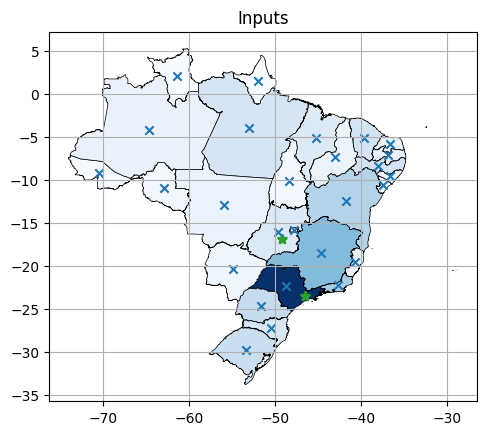

In [ ]:
no_treatment_centers = None
plot_inputs_map(patient_populations, no_treatment_centers, starting_points)

In [ ]:
def plot_singular_results_map(patient_populations, treatment_centers, starting_points, outputs):
  # Just results
  plt.figure(figsize=(12, 12))
  fig, ax = plt.subplots()
  patient_populations.plot(ax = ax, alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues') #, legend = True
  ax.scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  ax.scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", linewidths=0.05, label = 'Candidate treatment center')
  ax.scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point')
  ax.scatter(outputs['open_treatment_centers']['Longitude'], outputs['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05, label = 'Open treatment center')

  plt.legend(bbox_to_anchor=(1,1), loc="upper left")
  if outputs["title"]:
    title_text = outputs["title"]
  else:
    title_text = "Results"
  plt.title(title_text)
  plt.xlabel("Longitude")
  plt.ylabel("Latitude")
  ax.grid(True)
  ax.axis('scaled')

<Figure size 1200x1200 with 0 Axes>

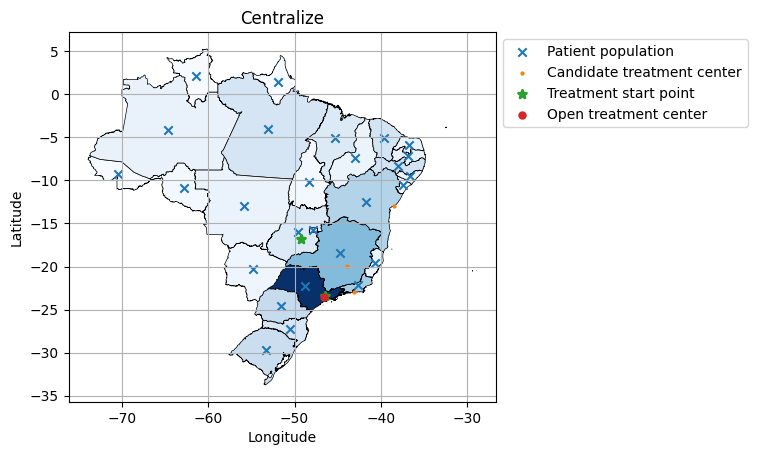

In [ ]:
plot_singular_results_map(patient_populations, treatment_centers, starting_points, outputs)

In [ ]:
def plot_three_results_maps(patient_populations, treatment_centers, starting_points, outputs1, outputs2, outputs3, super_title=None):
  """Designed to graph three results for different sets of parameters with the same set of candidate treatment center locations."""
  # Graph treatment centers, population centroids, starting points, and open treatment centers
  plt.figure(figsize=(12, 12))
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True)

  # Graph first case result
  patient_populations.plot(ax = ax1, alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
  ax1.scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  ax1.scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", label = 'Candidate treatment center')
  ax1.scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point')
  ax1.scatter(outputs1['open_treatment_centers']['Longitude'], outputs1['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05, label = 'Open treatment center')
  ax1.grid(True)
  ax1.axis('scaled')
  if outputs1["title"]:
    title1_text = outputs1["title"]
  else:
    title1_text = "Parameter Set 1"
  ax1.set_title(title1_text)

  # Graph second case result
  patient_populations.plot(ax = ax2, alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
  ax2.scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  ax2.scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", label = 'Candidate treatment center')
  ax2.scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point')
  ax2.scatter(outputs2['open_treatment_centers']['Longitude'], outputs2['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05, label = 'Open treatment center')
  ax2.grid(True)
  ax2.axis('scaled')
  if outputs2["title"]:
    title2_text = outputs2["title"]
  else:
    title2_text = "Parameter Set 2"
  ax2.set_title(title2_text)

  # Graph third case result
  patient_populations.plot(ax = ax3, alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
  ax3.scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  ax3.scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", label = 'Candidate treatment center')
  ax3.scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point')
  ax3.scatter(outputs3['open_treatment_centers']['Longitude'], outputs3['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05, label = 'Open treatment center')
  ax3.grid(True)
  ax3.axis('scaled')
  if outputs3["title"]:
    title3_text = outputs3["title"]
  else:
    title3_text = "Parameter Set 3"
  ax3.set_title(title3_text)

  plt.legend(bbox_to_anchor=(1,1), loc="upper left")

  if super_title:
    super_title_text = super_title
  else:
    super_title_text = "Side by Side"
  fig.suptitle(super_title_text)

<Figure size 1200x1200 with 0 Axes>

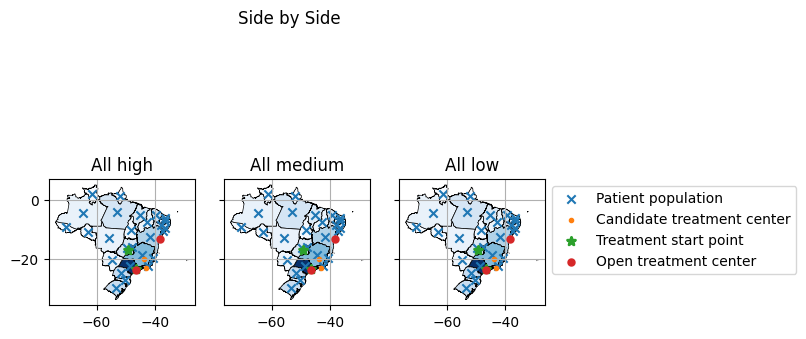

In [ ]:
plot_three_results_maps(patient_populations, treatment_centers, starting_points, outputs1, outputs2, outputs3, super_title=None)

Just histograms

In [ ]:
# Histogram rounded upper bounds

# Upper bound on maximum patient distance traveled (km) by any patient across patient population and
# candidate treatment center locations being compared.
max_patient_dist_traveled = 4500

# Upper bound on number of patients. Should be higher than the total number of patients estimated.
max_num_patients = 600

In [ ]:
def generate_hist_bin_edges_and_counts(outputs_dict, num_bins=10):
  """ Generates the edges of the bins and the counts for each bin to create a patient travel histogram.
  This function is needed as an alternative to matplotlib's hist() function, because many of the "numbers"
  of patients assigned from a specific patient population to a specific treatment center are fractional.
  This function adds up these fractional patients as opposed to rounding them out.
  Parameters:
    outputs_dict (dict): Outputs from a run of the pulp optimization model. Must include two key, value pairs:
                         - outputs["distances_pop2tc"] = df matrix of the distances between patient populations (rows) and treatment
                         centers (columns)
                         - outputs["patient_assignments"] = df matrix of the number of patients from a patient population (row) assigned
                         to a treatment center (column)
    num_bins (int): Number of bins for the histogram. Default is 10.
  Returns:
    bin_edges (list): List of edges of the bins for the histogram
    counts (list): List of counts of patients to go in each bin. len(counts) == len(bin_edges - 1)

  """
  distances_pop2tc = outputs_dict["distances_pop2tc"]

  min_km = 0
  max_km = max_patient_dist_traveled

  def generate_bin_edges_list(min, max, num_bins):
    bin_edges = [min]
    bin_size = (max - min)/num_bins
    next_edge = min + bin_size

    for bin in range(num_bins):
      bin_edges.append(next_edge)
      next_edge += bin_size

    return bin_edges

  bin_edges = generate_bin_edges_list(min_km, max_km, num_bins)

  counts = [0] * (len(bin_edges) - 1) # counts for each bin

  def binary_search(a, x):
    if x < a[0] or x > a[-1]:
        return None            # outside min/max range of a

    if x == a[0]:
        return 1       # want to include leftmost bin edge value in first bin

    i = bisect_left(a, x)
    return i

  PatientPopulations = distances_pop2tc.index
  TreatmentCenters = distances_pop2tc.columns

  patient_assignments = outputs_dict["patient_assignments"]

  for p in PatientPopulations:
    for tc in TreatmentCenters:
      distance = distances_pop2tc[tc][p]
      bin_index = binary_search(bin_edges, distance) - 1
      counts[bin_index] += patient_assignments.at[p, tc]

  return bin_edges, counts

In [ ]:
def plot_singular_patient_travel_histogram(outputs, bins=10):

  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges, counts = generate_hist_bin_edges_and_counts(outputs, bins)

  plt.stairs(counts, bin_edges, fill=True)

  ax = plt.gca()
  ax.set_ylim([0, max_num_patients])
  plt.xlabel("Distance traveled (km)")
  plt.ylabel("Number of patients")
  plt.title("Patient Travel Distance Histogram")

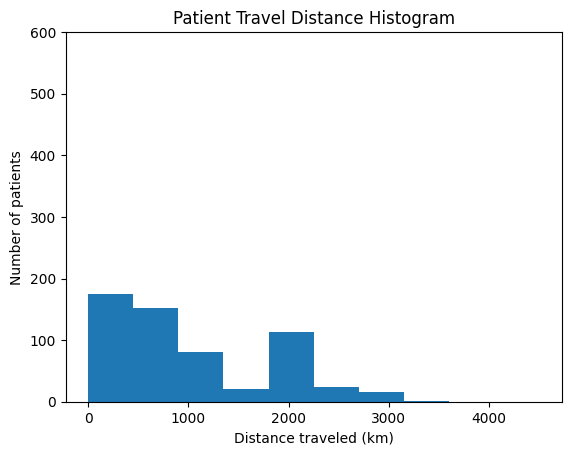

In [ ]:
# Example usage:
plot_singular_patient_travel_histogram(outputs)

In [ ]:
def plot_three_patient_travel_histograms(outputs1, outputs2, outputs3, bins=10, super_title=None):
  """Designed to graph three results for different sets of parameters with the same set of candidate treatment center locations."""
  plt.figure(figsize=(12, 12))
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True)

  # Graph first histogram:
  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs1["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges1, counts1 = generate_hist_bin_edges_and_counts(outputs, bins)

  ax1.stairs(counts1, bin_edges1, fill=True)
  if outputs1["title"]:
    title1_text = outputs1["title"]
  else:
    title1_text = "Parameter Set 1"
  ax1.set_title(title1_text)
  ax1.set_ylim([0, max_num_patients])

  # Second histogram:
  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs2["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges2, counts2 = generate_hist_bin_edges_and_counts(outputs2, bins)

  ax2.stairs(counts2, bin_edges2, fill=True)
  if outputs2["title"]:
    title2_text = outputs2["title"]
  else:
    title2_text = "Parameter Set 2"
  ax2.set_title(title2_text)
  ax2.set_ylim([0, max_num_patients])

  # Third histogram:
  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs3["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges3, counts3 = generate_hist_bin_edges_and_counts(outputs3, bins)

  ax3.stairs(counts3, bin_edges3, fill=True)
  if outputs3["title"]:
    title3_text = outputs3["title"]
  else:
    title3_text = "Parameter Set 3"
  ax3.set_title(title3_text)
  ax3.set_ylim([0, max_num_patients])

  # Hack-y way to label the axes... there's probably a better way
  ax2.set_xlabel("Distance traveled (km)")
  ax1.set_ylabel("Number of patients")

  if super_title:
    super_title_text = super_title
  else:
    super_title_text = "Patient Travel Distance Histograms"
  plt.suptitle(super_title_text)

<Figure size 1200x1200 with 0 Axes>

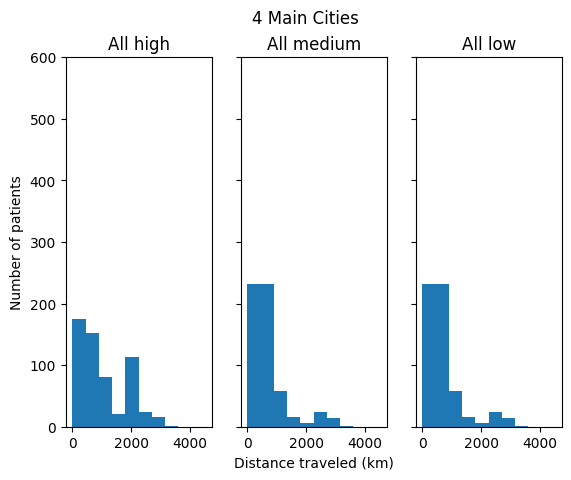

In [ ]:
plot_three_patient_travel_histograms(outputs1, outputs2, outputs3, bins=10, super_title="4 Main Cities")

Just printouts

In [ ]:
def print_input_parameters(inputs):
  print("Parameters:")
  print("Patient travel cost per km:", inputs["patient_travel_cost_per_unit_dist"])
  print()
  print("Treatment transport cost per km:", inputs["treatment_transport_cost_per_unit_dist"])
  print()
  print("Cost per treatment center:", f"{inputs['cost_per_treatment_center']:,d}")
  print()
  print("DMD cases per person in general population:", round(Decimal(DMD_incidence_in_general_population), 6))
  print("Fraction of DMD patients to treat:", round(Decimal(fraction_of_DMD_patients_to_treat), 2))

In [ ]:
print_input_parameters(centralize)

Parameters:
Patient travel cost per km: 2

Treatment transport cost per km: 2

Cost per treatment center: 500,000

DMD cases per person in general population: 0.000028
Fraction of DMD patients to treat: 0.10


In [ ]:
def print_output_parameters(outputs):
  print("Outputs:")
  print("Centers opened:", int(outputs['num_centers_opened']))
  print()
  print("Average patient travel distance:", f"{int(outputs['avg_patient_travel_dist']):,d}", "km")
  print("Average treament transportation distance:", f"{int(outputs['avg_treatment_transport_dist']):,d}", "km")
  print()
  print("Patient travel weighted costs:", f"{int(outputs['patient_travel_costs']):,d}")
  print("Treatment transportation weighted costs:", f"{int(outputs['treatment_transportation_costs']):,d}")
  print("Treatment center weighted fixed costs:", f"{int(outputs['treatment_center_fixed_costs']):,d}")

In [ ]:
print_output_parameters(outputs)

Outputs:
Centers opened: 1

Average patient travel distance: 1,046 km
Average treament transportation distance: 21 km

Patient travel weighted costs: 1,215,975
Treatment transportation weighted costs: 25,397
Treatment center weighted fixed costs: 500,000


In [ ]:
def print_output_parameters_with_best_guess_costs(outputs, best_guess_parameters):
  """Prints both the priority-weighted costs from the run of the optimization model, as well as the estimated, unweighted,
  monetary costs given the set of treatment centers selected by the model and the best guess parameters.
  Parameters:
  - outputs: (dict) outputs from run_pulp_optimization_model(). This function specifically uses the following keys:
                    "patients", "avg_patient_travel_dist", "avg_treatment_transport_dist", "num_centers_opened",
                    "patient_travel_costs", "treatment_transportation_costs", and "treatment_center_fixed_costs"
  - best_guess_parameters: (dict) dictionary containing the best guess for actual, unweighted, values of
              "patient_travel_cost_per_unit_dist", "treatment_transport_cost_per_unit_dist", and
              "cost_per_treatment_center", which contains each of those three keys."""
  print("Outputs:")
  print("Centers opened:", int(outputs['num_centers_opened']))
  print()
  print("Average patient travel distance:", f"{int(outputs['avg_patient_travel_dist']):,d}", "km")
  print("Average treatment transportation distance:", f"{int(outputs['avg_treatment_transport_dist']):,d}", "km")
  print()
  # Best guess as to actual patient travel costs given this set of center locations selected:
  # multiply the number of patients, the average distance traveled by a patient, and best guess per patient-travel-km cost
  est_patient_travel_costs = outputs["avg_patient_travel_dist"] * outputs["patients"] * best_guess_parameters["patient_travel_cost_per_unit_dist"]
  print("Est. patient travel costs:", f"{int(est_patient_travel_costs):,d}")

  # Best guess as to actual treatment transport costs given this set of center locations selected:
  # multiply the number of patients, the average distance a treatment was transported, and best guess per treatment-transport-km cost
  est_treatment_transport_costs = outputs["avg_treatment_transport_dist"] * outputs["patients"] * best_guess_parameters["treatment_transport_cost_per_unit_dist"]
  print("Est. treatment transport costs:", f"{int(est_treatment_transport_costs):,d}")

  # Best guess as to actual center costs given this set (number) of center locations selected:
  # multiply the number of center locations selected by the best guess per-treatment-center cost
  est_center_cost = outputs["num_centers_opened"] * best_guess_parameters["cost_per_treatment_center"]
  print("Est. center costs:", f"{int(est_center_cost):,d}")
  print()
  print("Patient travel weighted costs:", f"{int(outputs['patient_travel_costs']):,d}")
  print("Treatment transportation weighted costs:", f"{int(outputs['treatment_transportation_costs']):,d}")
  print("Treatment center fixed weighted costs:", f"{int(outputs['treatment_center_fixed_costs']):,d}")

In [ ]:
best_guess_parameters = all_medium
print_output_parameters_with_best_guess_costs(outputs, best_guess_parameters)

Outputs:
Centers opened: 1

Average patient travel distance: 1,046 km
Average treatment transportation distance: 21 km

Est. patient travel costs: 2,431,950
Est. treatment transport costs: 25,397
Est. center costs: 100,000

Patient travel weighted costs: 1,215,975
Treatment transportation weighted costs: 25,397
Treatment center fixed weighted costs: 500,000


In [ ]:
def print_three_output_parameters(outputs1, outputs2, outputs3, super_title=None):
  "WARNING: this function prints the weighted costs from the model, not the unweighted estimated costs."
  plt.figure(figsize=(12, 12))
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True)

  # First output parameters
  ax1.text(0.04, 1.1, "Centers opened: " + str(int(outputs1['num_centers_opened'])))
  ax1.text(0.04, 0.85, "Patient travel" + "\n" + "costs: " + f"{int(outputs1['patient_travel_costs']):,d}")
  ax1.text(0.04, 0.6, "Treatment transport" + "\n" + "costs: " + f"{int(outputs1['treatment_transportation_costs']):,d}")
  ax1.text(0.04, 0.35, "Center fixed" + "\n" + "costs: " + f"{int(outputs1['treatment_center_fixed_costs']):,d}")
  if outputs1["title"]:
    title1_text = outputs1["title"]
  else:
    title1_text = "Parameter Set 1"
  ax1.set_title(title1_text)

  # Second output parameters
  ax2.text(0.04, 1.1, "Centers opened: " + str(int(outputs2['num_centers_opened'])))
  ax2.text(0.04, 0.85, "Patient travel" + "\n" + "costs: " + f"{int(outputs2['patient_travel_costs']):,d}")
  ax2.text(0.04, 0.6, "Treatment transport" + "\n" + "costs: " + f"{int(outputs2['treatment_transportation_costs']):,d}")
  ax2.text(0.04, 0.35, "Center fixed" + "\n" + "costs: " + f"{int(outputs2['treatment_center_fixed_costs']):,d}")
  if outputs2["title"]:
    title2_text = outputs2["title"]
  else:
    title2_text = "Parameter Set 2"
  ax2.set_title(title2_text)

  # Third output parameters
  ax3.text(0.04, 1.1, "Centers opened: " + str(int(outputs3['num_centers_opened'])))
  ax3.text(0.04, 0.85, "Patient travel" + "\n" + "costs: " + f"{int(outputs3['patient_travel_costs']):,d}")
  ax3.text(0.04, 0.6, "Treatment transport" + "\n" + "costs: " + f"{int(outputs3['treatment_transportation_costs']):,d}")
  ax3.text(0.04, 0.35, "Center fixed" + "\n" + "costs: " + f"{int(outputs3['treatment_center_fixed_costs']):,d}")
  if outputs3["title"]:
    title3_text = outputs3["title"]
  else:
    title3_text = "Parameter Set 3"
  ax3.set_title(title3_text)

  for ax in (ax1, ax2, ax3):
    ax.set(xlim=(0, 1), ylim=(0, 1.25), xticks=[], yticks=[], aspect=1.25)

  if super_title:
    super_title_text = super_title
  else:
    super_title_text = "Results"

  fig.suptitle(super_title_text)

<Figure size 1200x1200 with 0 Axes>

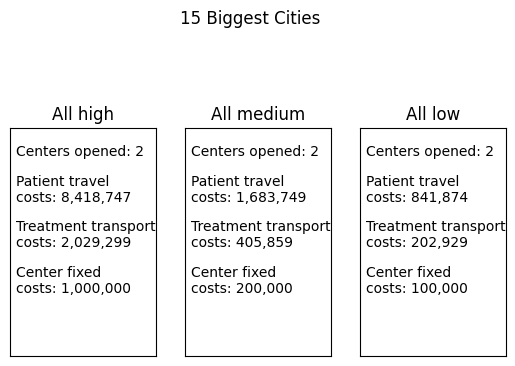

In [ ]:
print_three_output_parameters(outputs1, outputs2, outputs3, super_title="15 Biggest Cities")

Combo maps, histograms, printouts

In [ ]:
def plot_one_result(patient_populations, treatment_centers, starting_points, outputs, bins=10, mark_patient_populations=True):
  """WARNING: this function prints the weighted costs, not the unweighted estimated actual costs.
  See plot_one_result_with_best_guess_parameters(...), plot_one_result_with_all_metrics(...)."""
  plt.figure(figsize=(12, 12))
  fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=False, sharey=False)
  fig.tight_layout(h_pad=2.0)

  # Map
  patient_populations.plot(ax = ax1, alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
  if mark_patient_populations:
    ax1.scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  else:
    ax1.scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker=".", label = 'Patient population')
  ax1.scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", label = 'Candidate treatment center')
  ax1.scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point')
  ax1.scatter(outputs['open_treatment_centers']['Longitude'], outputs['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05, label = 'Open treatment center')
  #ax1.grid(True)
  ax1.axis('scaled')
  if outputs["title"]:
    title1_text = outputs["title"]
  else:
    title1_text = "Parameter Set 1"
  ax1.set_title(title1_text)

  # TODO not working rn
  plt.legend(bbox_to_anchor=(1,1), loc="upper left")

  # Histogram
  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges, counts = generate_hist_bin_edges_and_counts(outputs, bins)

  ax2.stairs(counts, bin_edges, fill=True)
  ax2.set_xlabel("Dist. traveled (km)")
  ax2.set_ylabel("# patients")
  ax2.set_ylim([0, max_num_patients])
  ax2.set_aspect(5)

  # Other output parameters
  ax3.text(0.04, 1.35, "Centers: " + str(int(outputs['num_centers_opened'])))
  ax3.text(0.04, 0.9, "PT costs: " +  f"{int(outputs['patient_travel_costs']):,d}")
  ax3.text(0.04, 0.45, "TT costs: "  + f"{int(outputs['treatment_transportation_costs']):,d}")
  ax3.text(0.04, 0.0, "Center costs: "  + f"{int(outputs['treatment_center_fixed_costs']):,d}")

  ax3.set(xlim=(0, 2.2), ylim=(0, 1.5), xticks=[], yticks=[], aspect=1.25)
  ax3.spines['top'].set_visible(False)
  ax3.spines['right'].set_visible(False)
  ax3.spines['bottom'].set_visible(False)
  ax3.spines['left'].set_visible(False)




<Figure size 1200x1200 with 0 Axes>

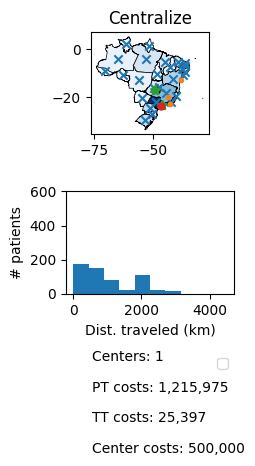

In [ ]:
plot_one_result(patient_populations, treatment_centers, starting_points, outputs, bins=10, mark_patient_populations=True)

<Figure size 1200x1200 with 0 Axes>

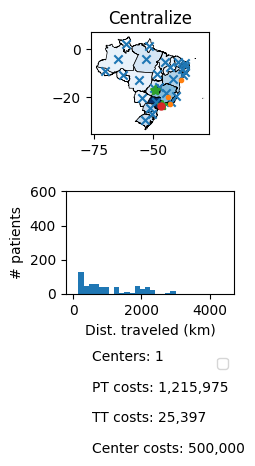

In [ ]:
plot_one_result(patient_populations, treatment_centers, starting_points, outputs, bins=30)

In [ ]:
def plot_one_result_with_best_guess_parameters(patient_populations, treatment_centers, starting_points, outputs, best_guess_parameters, bins=10, mark_patient_populations=True):
  """Plots one result from the optimization model including map, histogram, and printout. Printout costs are the estimated
  Actual costs given the treatment centers selected by the model and the best_guess_parameter cost estimates."""
  plt.figure(figsize=(12, 12))
  fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=False, sharey=False)
  fig.tight_layout(h_pad=2.0)

  # Map
  patient_populations.plot(ax = ax1, alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
  if mark_patient_populations:
    ax1.scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  else:
    ax1.scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker=".", label = 'Patient population')
  ax1.scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", label = 'Candidate treatment center')
  ax1.scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point')
  ax1.scatter(outputs['open_treatment_centers']['Longitude'], outputs['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05, label = 'Open treatment center')
  #ax1.grid(True)
  ax1.axis('scaled')
  if outputs["title"]:
    title1_text = outputs["title"]
  else:
    title1_text = "Parameter Set 1"
  ax1.set_title(title1_text)

  # TODO not working rn
  plt.legend(bbox_to_anchor=(1,1), loc="upper left")

  # Histogram
  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges, counts = generate_hist_bin_edges_and_counts(outputs, bins)

  ax2.stairs(counts, bin_edges, fill=True)
  ax2.set_xlabel("Dist. traveled (km)")
  ax2.set_ylabel("# patients")
  ax2.set_ylim([0, max_num_patients])
  ax2.set_aspect(5)

  # Best guess as to actual patient travel costs given this set of center locations selected:
  # multiply the number of patients, the average distance traveled by a patient, and best guess per patient-travel-km cost
  est_patient_travel_costs = outputs["avg_patient_travel_dist"] * outputs["patients"] * best_guess_parameters["patient_travel_cost_per_unit_dist"]

  # Best guess as to actual treatment transport costs given this set of center locations selected:
  # multiply the number of patients, the average distance a treatment was transported, and best guess per treatment-transport-km cost
  est_treatment_transport_costs = outputs["avg_treatment_transport_dist"] * outputs["patients"] * best_guess_parameters["treatment_transport_cost_per_unit_dist"]

  # Best guess as to actual center costs given this set (number) of center locations selected:
  # multiply the number of center locations selected by the best guess per-treatment-center cost
  est_center_cost = outputs["num_centers_opened"] * best_guess_parameters["cost_per_treatment_center"]

  # Other output parameters
  ax3.text(0.04, 1.35, "Centers: " + str(int(outputs['num_centers_opened'])))
  ax3.text(0.04, 0.9, "PT costs: " +  f"{int(est_patient_travel_costs):,d}")
  ax3.text(0.04, 0.45, "TT costs: "  + f"{int(est_treatment_transport_costs):,d}")
  ax3.text(0.04, 0.0, "Center costs: "  + f"{int(est_center_cost):,d}")

  ax3.set(xlim=(0, 2.2), ylim=(0, 1.5), xticks=[], yticks=[], aspect=1.25)
  ax3.spines['top'].set_visible(False)
  ax3.spines['right'].set_visible(False)
  ax3.spines['bottom'].set_visible(False)
  ax3.spines['left'].set_visible(False)

<Figure size 1200x1200 with 0 Axes>

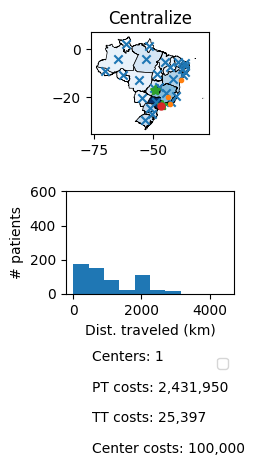

In [ ]:
plot_one_result_with_best_guess_parameters(patient_populations, treatment_centers, starting_points, outputs, best_guess_parameters)

In [ ]:
def plot_one_result_with_all_metrics(patient_populations, treatment_centers, starting_points, outputs, best_guess_parameters, bins=10, mark_patient_populations=True):
  """Plots one result from the optimization model including map, histogram, and printout. Printout costs include both the
  weighted cost subtotals and the estimated actual costs given the treatment centers selected by the model and the
  best_guess_parameter cost estimates."""
  plt.figure(figsize=(12, 12))
  fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=False, sharey=False)
  fig.tight_layout(h_pad=2.0, pad=1.5, w_pad=0.5)

  # Map
  if mark_patient_populations:
    patient_populations.plot(ax = ax1, alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
    ax1.scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  else:
    patient_populations.plot(ax = ax1, alpha=1, edgecolor="tab:blue", linewidths=0.5, color="tab:blue")
  ax1.scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", label = 'Candidate treatment center', color="tab:orange")
  ax1.scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point', color="tab:green")
  ax1.scatter(outputs['open_treatment_centers']['Longitude'], outputs['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05,
              label = 'Open treatment center', color="tab:red")
  #ax1.grid(True)
  ax1.axis('scaled')
  if outputs["title"]:
    title1_text = outputs["title"]
  else:
    title1_text = "Parameter Set 1"
  ax1.set_title(title1_text)

  # TODO not working rn
  plt.legend(bbox_to_anchor=(1,1), loc="upper left")

  # Histogram
  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges, counts = generate_hist_bin_edges_and_counts(outputs, bins)

  ax2.stairs(counts, bin_edges, fill=True)
  ax2.set_xlabel("Dist. traveled (km)")
  ax2.set_ylabel("# patients")
  ax2.set_ylim([0, max_num_patients])
  ax2.set_aspect(5)

  # Best guess as to actual patient travel costs given this set of center locations selected:
  # multiply the number of patients, the average distance traveled by a patient, and best guess per patient-travel-km cost
  est_patient_travel_costs = outputs["avg_patient_travel_dist"] * outputs["patients"] * best_guess_parameters["patient_travel_cost_per_unit_dist"]

  # Best guess as to actual treatment transport costs given this set of center locations selected:
  # multiply the number of patients, the average distance a treatment was transported, and best guess per treatment-transport-km cost
  est_treatment_transport_costs = outputs["avg_treatment_transport_dist"] * outputs["patients"] * best_guess_parameters["treatment_transport_cost_per_unit_dist"]

  # Best guess as to actual center costs given this set (number) of center locations selected:
  # multiply the number of center locations selected by the best guess per-treatment-center cost
  est_center_cost = outputs["num_centers_opened"] * best_guess_parameters["cost_per_treatment_center"]

  # Solution parameters
  ax3.text(0.2, 1.84, "Center locations: " + str(int(outputs['num_centers_opened'])))
  ax3.text(0.2, 1.61, "Avg. TT dist.: " +  f"{int(round(outputs['avg_treatment_transport_dist'])):,d}" + " km")
  ax3.text(0.2, 1.38, "Avg. PT dist: "  + f"{int(round(outputs['avg_patient_travel_dist'])):,d}" + " km")

  # Weighted subtotals
  ax3.text(0.2, 1.15, "Center subtotal: " + f"{int(outputs['treatment_center_fixed_costs']):,d}")
  ax3.text(0.2, 0.92, "TT subtotal: " +  f"{int(outputs['treatment_transportation_costs']):,d}")
  ax3.text(0.2, 0.69, "PT subtotal: "  + f"{int(outputs['patient_travel_costs']):,d}")

  # Estimated costs
  ax3.text(0.2, 0.46, "Est. center costs: " +  f"{int(est_center_cost):,d}")
  ax3.text(0.2, 0.23, "Est. TT costs: "  + f"{int(est_treatment_transport_costs):,d}")
  ax3.text(0.2, 0.0, "Est. PT costs: "  + f"{int(est_patient_travel_costs):,d}")

  ax3.set(xlim=(0, 5), ylim=(0, 1.9), xticks=[], yticks=[], aspect=1.25)
  ax3.spines['top'].set_visible(False)
  ax3.spines['right'].set_visible(False)
  ax3.spines['bottom'].set_visible(False)
  ax3.spines['left'].set_visible(False)

<Figure size 1200x1200 with 0 Axes>

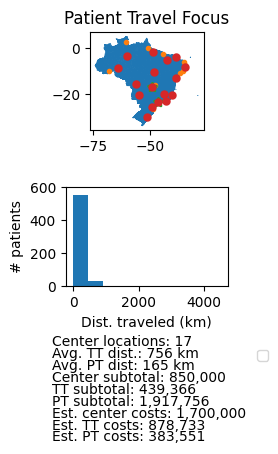

In [ ]:
plot_one_result_with_all_metrics(patient_populations, treatment_centers, starting_points, outputs, best_guess_parameters, bins=10, mark_patient_populations=False)

In [ ]:
def plot_three_results(patient_populations, treatment_centers, starting_points, outputs1, outputs2, outputs3, bins=10, super_title=None,
                       mark_patient_populations=True):
  """WARNING: this function prints the weighted costs from the optimization model, not estimates of actual costs."""
  plt.figure(figsize=(21, 21))
  fig, axs = plt.subplots(3, 3, sharex='row', sharey='row') # Each row shares x and y axes

  # Maps
  # First map
  patient_populations.plot(ax = axs[0,0], alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
  if mark_patient_populations:
    axs[0,0].scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  else:
    axs[0,0].scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker=".", label = 'Patient population')
  axs[0,0].scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", label = 'Candidate treatment center')
  axs[0,0].scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point')
  axs[0,0].scatter(outputs1['open_treatment_centers']['Longitude'], outputs1['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05, label = 'Open treatment center')
  #axs[0,0].grid(True)
  axs[0,0].axis('scaled')
  if outputs1["title"]:
    title1_text = outputs1["title"]
  else:
    title1_text = "Parameter Set 1"
  axs[0,0].set_title(title1_text)

  # Second map
  patient_populations.plot(ax = axs[0,1], alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
  if mark_patient_populations:
    axs[0,1].scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  else:
    axs[0,1].scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker=".", label = 'Patient population')
  axs[0,1].scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", label = 'Candidate treatment center')
  axs[0,1].scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point')
  axs[0,1].scatter(outputs2['open_treatment_centers']['Longitude'], outputs2['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05, label = 'Open treatment center')
  #axs[0,1].grid(True)
  axs[0,1].axis('scaled')
  if outputs2["title"]:
    title2_text = outputs2["title"]
  else:
    title2_text = "Parameter Set 2"
  axs[0,1].set_title(title2_text)

  # Third map
  patient_populations.plot(ax = axs[0,2], alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
  if mark_patient_populations:
    axs[0,2].scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  else:
    axs[0,2].scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker=".", label = 'Patient population')
  axs[0,2].scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", label = 'Candidate treatment center')
  axs[0,2].scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point')
  axs[0,2].scatter(outputs3['open_treatment_centers']['Longitude'], outputs3['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05, label = 'Open treatment center')
  #axs[0,2].grid(True)
  axs[0,2].axis('scaled')
  if outputs3["title"]:
    title3_text = outputs3["title"]
  else:
    title3_text = "Parameter Set 3"
  axs[0,2].set_title(title3_text)

  # TODO not working rn
  plt.legend(bbox_to_anchor=(1,1), loc="upper left")


  # Histograms
  # Graph first histogram:
  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs1["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges1, counts1 = generate_hist_bin_edges_and_counts(outputs1, bins)

  axs[1,0].stairs(counts1, bin_edges1, fill=True)
  axs[1,0].set_xlabel("Dist. traveled (km)")
  axs[1,0].set_ylabel("# patients")
  axs[1,0].set_ylim([0, max_num_patients])

  # Second histogram:
  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs2["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges2, counts2 = generate_hist_bin_edges_and_counts(outputs2, bins)

  axs[1,1].stairs(counts2, bin_edges2, fill=True)
  axs[1,1].set_xlabel("Dist. traveled (km)")
  axs[1,1].set_ylim([0, max_num_patients])

  # Third histogram:
  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs3["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges3, counts3 = generate_hist_bin_edges_and_counts(outputs3, bins)

  axs[1,2].stairs(counts3, bin_edges3, fill=True)
  axs[1,2].set_xlabel("Dist. traveled (km)")
  axs[1,2].set_ylim([0, max_num_patients])


  # Other output numbers
  # First output parameters
  axs[2,0].text(0.04, 1.35, "Centers: " + str(int(outputs1['num_centers_opened'])))
  axs[2,0].text(0.04, 0.9, "PT costs: " +  f"{int(outputs1['patient_travel_costs']):,d}")
  axs[2,0].text(0.04, 0.45, "TT costs: "  + f"{int(outputs1['treatment_transportation_costs']):,d}")
  axs[2,0].text(0.04, 0.0, "Center costs: "  + f"{int(outputs1['treatment_center_fixed_costs']):,d}")

  # Second output parameters
  axs[2,1].text(0.04, 1.35, "Centers: " + str(int(outputs2['num_centers_opened'])))
  axs[2,1].text(0.04, 0.9, "PT costs: " + f"{int(outputs2['patient_travel_costs']):,d}")
  axs[2,1].text(0.04, 0.45, "TT costs: " + f"{int(outputs2['treatment_transportation_costs']):,d}")
  axs[2,1].text(0.04, 0.0, "Center costs: " + f"{int(outputs2['treatment_center_fixed_costs']):,d}")

  # Third output parameters
  axs[2,2].text(0.04, 1.35, "Centers: " + str(int(outputs3['num_centers_opened'])))
  axs[2,2].text(0.04, 0.9, "PT costs: " + f"{int(outputs3['patient_travel_costs']):,d}")
  axs[2,2].text(0.04, 0.45, "TT costs: " + f"{int(outputs3['treatment_transportation_costs']):,d}")
  axs[2,2].text(0.04, 0.0, "Center costs: " + f"{int(outputs3['treatment_center_fixed_costs']):,d}")


  for ax in (axs[2,0], axs[2,1], axs[2,2]):
    ax.set(xlim=(0, 2.2), ylim=(0, 1.5), xticks=[], yticks=[], aspect=1.25)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

  if super_title:
    super_title_text = super_title
  else:
    super_title_text = "Side by Side"
  fig.suptitle(super_title_text)

  fig.tight_layout()


<Figure size 2100x2100 with 0 Axes>

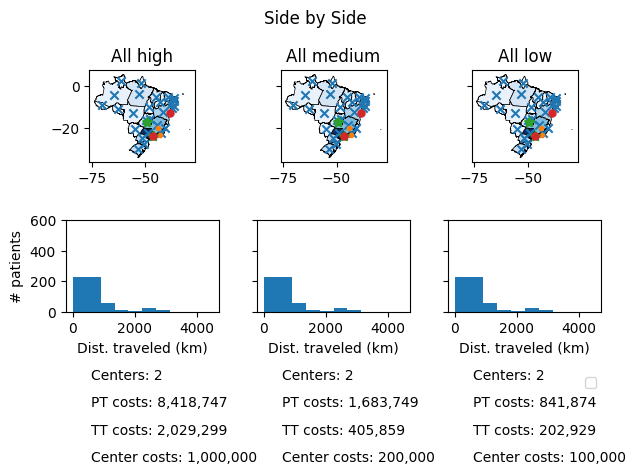

In [ ]:
plot_three_results(patient_populations, treatment_centers, starting_points, outputs1, outputs2, outputs3)

In [ ]:
def plot_three_results_with_all_metrics(patient_populations, treatment_centers, starting_points, outputs1, outputs2, outputs3, best_guess_parameters, bins=10, super_title=None,
                       mark_patient_populations=True):
  """Similar to plot_one_result_with_all_metics(...), but designed to compare three sets of priorities with the same candidate locations."""
  plt.figure(figsize=(21, 21))
  fig, axs = plt.subplots(3, 3, sharex='row', sharey='row') # Each row shares x and y axes

  # Maps
  # First map
  if mark_patient_populations:
    patient_populations.plot(ax = axs[0,0], alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
    axs[0,0].scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  else:
    patient_populations.plot(ax = axs[0,0], alpha=1, edgecolor="tab:blue", linewidths=0.5, color="tab:blue")
  axs[0,0].scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", label = 'Candidate treatment center', color="tab:orange")
  axs[0,0].scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point', color="tab:green")
  axs[0,0].scatter(outputs1['open_treatment_centers']['Longitude'], outputs1['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05,
                   label = 'Open treatment center', color="tab:red")
  axs[0,0].axis('scaled')
  if outputs1["title"]:
    title1_text = outputs1["title"]
  else:
    title1_text = "Parameter Set 1"
  axs[0,0].set_title(title1_text)

  # Second map
  if mark_patient_populations:
    patient_populations.plot(ax = axs[0,1], alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
    axs[0,1].scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  else:
    patient_populations.plot(ax = axs[0,1], alpha=1, edgecolor="tab:blue", linewidths=0.5, color="tab:blue")
  axs[0,1].scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", label = 'Candidate treatment center', color="tab:orange")
  axs[0,1].scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point', color="tab:green")
  axs[0,1].scatter(outputs2['open_treatment_centers']['Longitude'], outputs2['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05,
                   label = 'Open treatment center', color="tab:red")
  axs[0,1].axis('scaled')
  if outputs2["title"]:
    title2_text = outputs2["title"]
  else:
    title2_text = "Parameter Set 2"
  axs[0,1].set_title(title2_text)

  # Third map
  if mark_patient_populations:
    patient_populations.plot(ax = axs[0,2], alpha=1, edgecolor="black", linewidths=0.5, column = "population", cmap='Blues')
    axs[0,2].scatter(patient_populations['centroid_long'], patient_populations['centroid_lat'], marker="x", label = 'Patient population')
  else:
    patient_populations.plot(ax = axs[0,2], alpha=1, edgecolor="tab:blue", linewidths=0.5, color="tab:blue")
  axs[0,2].scatter(treatment_centers['Longitude'], treatment_centers['Latitude'], marker=".", label = 'Candidate treatment center', color="tab:orange")
  axs[0,2].scatter(starting_points['Longitude'], starting_points['Latitude'], marker="*", linewidths=2, label = 'Treatment start point', color="tab:green")
  axs[0,2].scatter(outputs3['open_treatment_centers']['Longitude'], outputs3['open_treatment_centers']['Latitude'], marker="o", linewidths=0.05,
                   label = 'Open treatment center', color="tab:red")
  #axs[0,2].grid(True)
  axs[0,2].axis('scaled')
  if outputs3["title"]:
    title3_text = outputs3["title"]
  else:
    title3_text = "Parameter Set 3"
  axs[0,2].set_title(title3_text)

  # TODO not working rn
  plt.legend(bbox_to_anchor=(1,1), loc="upper left")


  # Histograms
  # Graph first histogram:
  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs1["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges1, counts1 = generate_hist_bin_edges_and_counts(outputs1, bins)

  axs[1,0].stairs(counts1, bin_edges1, fill=True)
  axs[1,0].set_xlabel("Dist. traveled (km)")
  axs[1,0].set_ylabel("# patients")
  axs[1,0].set_ylim([0, max_num_patients])

  # Second histogram:
  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs2["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges2, counts2 = generate_hist_bin_edges_and_counts(outputs2, bins)

  axs[1,1].stairs(counts2, bin_edges2, fill=True)
  axs[1,1].set_xlabel("Dist. traveled (km)")
  axs[1,1].set_ylim([0, max_num_patients])

  # Third histogram:
  # If there are distances longer than max_patient_dist_traveled, it should be reset
  assert outputs3["distances_pop2tc"].max().max() <= max_patient_dist_traveled

  bin_edges3, counts3 = generate_hist_bin_edges_and_counts(outputs3, bins)

  axs[1,2].stairs(counts3, bin_edges3, fill=True)
  axs[1,2].set_xlabel("Dist. traveled (km)")
  axs[1,2].set_ylim([0, max_num_patients])


  # Other outputs:

  for ax, outputs in [(axs[2,0], outputs1), (axs[2,1], outputs2), (axs[2,2], outputs3)]:

    # Best guess as to actual patient travel costs given this set of center locations selected:
    # multiply the number of patients, the average distance traveled by a patient, and best guess per patient-travel-km cost
    est_patient_travel_costs = outputs["avg_patient_travel_dist"] * outputs["patients"] * best_guess_parameters["patient_travel_cost_per_unit_dist"]

    # Best guess as to actual treatment transport costs given this set of center locations selected:
    # multiply the number of patients, the average distance a treatment was transported, and best guess per treatment-transport-km cost
    est_treatment_transport_costs = outputs["avg_treatment_transport_dist"] * outputs["patients"] * best_guess_parameters["treatment_transport_cost_per_unit_dist"]

    # Best guess as to actual center costs given this set (number) of center locations selected:
    # multiply the number of center locations selected by the best guess per-treatment-center cost
    est_center_cost = outputs["num_centers_opened"] * best_guess_parameters["cost_per_treatment_center"]

    # Solution parameters
    ax.text(0.1, 1.84, "Center locations: " + str(int(outputs['num_centers_opened'])), fontsize='small')
    ax.text(0.1, 1.61, "Avg. TT dist.: " +  f"{int(round(outputs['avg_treatment_transport_dist'])):,d}" + " km", fontsize='small')
    ax.text(0.1, 1.38, "Avg. PT dist: "  + f"{int(round(outputs['avg_patient_travel_dist'])):,d}" + " km", fontsize='small')

    # Weighted subtotals
    ax.text(0.1, 1.15, "Center subtotal: " + f"{int(outputs['treatment_center_fixed_costs']):,d}", fontsize='small')
    ax.text(0.1, 0.92, "TT subtotal: " +  f"{int(outputs['treatment_transportation_costs']):,d}", fontsize='small')
    ax.text(0.1, 0.69, "PT subtotal: "  + f"{int(outputs['patient_travel_costs']):,d}", fontsize='small')

    # Estimated costs
    ax.text(0.1, 0.46, "Est. center costs: " +  f"{int(est_center_cost):,d}", fontsize='small')
    ax.text(0.1, 0.23, "Est. TT costs: "  + f"{int(est_treatment_transport_costs):,d}", fontsize='small')
    ax.text(0.1, 0.0, "Est. PT costs: "  + f"{int(est_patient_travel_costs):,d}", fontsize='small')


  for ax in (axs[2,0], axs[2,1], axs[2,2]):
    ax.set(xlim=(0, 7), ylim=(0, 1.9), xticks=[], yticks=[], aspect=2.5)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

  if super_title:
    super_title_text = super_title
  else:
    super_title_text = "Side by Side"
  fig.suptitle(super_title_text)

  fig.tight_layout()

<Figure size 2100x2100 with 0 Axes>

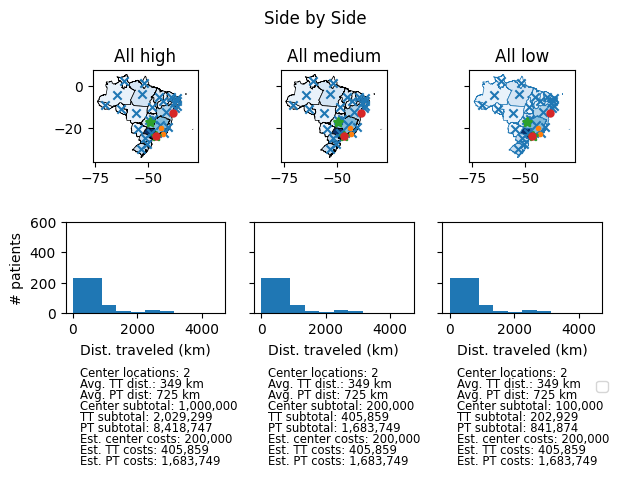

In [ ]:
plot_three_results_with_all_metrics(patient_populations, treatment_centers, starting_points, outputs1, outputs2, outputs3, best_guess_parameters, bins=10, super_title=None,
                       mark_patient_populations=True)

Calling functions to generate results

In [ ]:
approaches = [centralize, copy_other_gene_therapies, early_adopting_physicians, government_instruction, patient_centric]
#approaches = [early_adopting_physicians]

<Figure size 1200x1200 with 0 Axes>

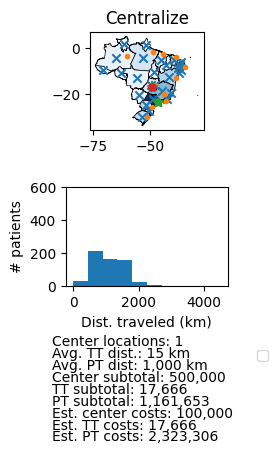

<Figure size 1200x1200 with 0 Axes>

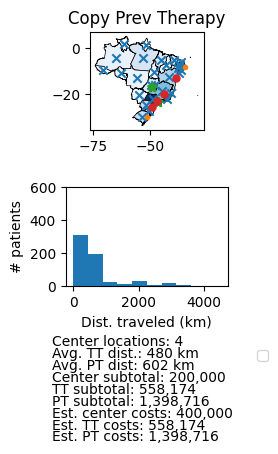

<Figure size 1200x1200 with 0 Axes>

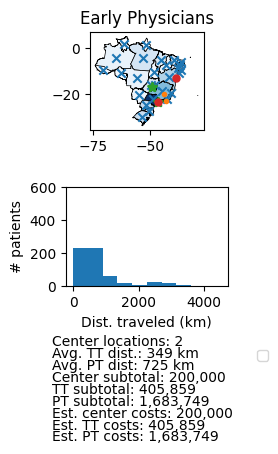

<Figure size 1200x1200 with 0 Axes>

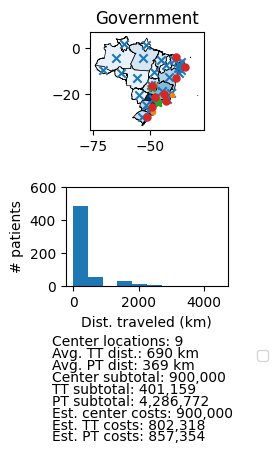

<Figure size 1200x1200 with 0 Axes>

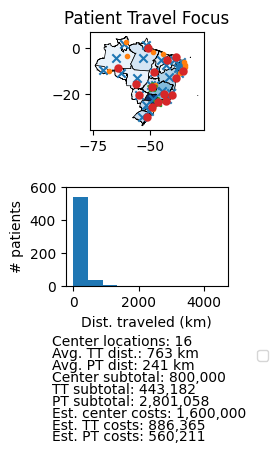

In [ ]:
# Generate results and combo plots for each named approach
for approach in approaches:
  treatment_centers = process_treatment_center_data(approach["tc_filename"])
  outputs = run_one_parameter_set(patient_populations, treatment_centers, starting_points, approach)
  #np.save("municipality_" + approach["title"] + "_outputs.npy", outputs)
  plot_one_result_with_all_metrics(patient_populations, treatment_centers, starting_points, outputs, all_medium, bins=10, mark_patient_populations=True)
  plt.savefig("Approaches_States_" + approach["title"] + ".png")

In [ ]:
# Load saved output example
saved_outputs = np.load("municipality_Centralize_outputs.npy", allow_pickle=True).item()
saved_outputs.keys()

dict_keys(['title', 'distances_pop2tc', 'patients', 'opt_status', 'total_cost', 'open_treatment_centers', 'num_centers_opened', 'avg_patient_travel_dist', 'avg_treatment_transport_dist', 'patient_travel_costs', 'treatment_transportation_costs', 'treatment_center_fixed_costs', 'patient_assignments'])

<Figure size 1200x1200 with 0 Axes>

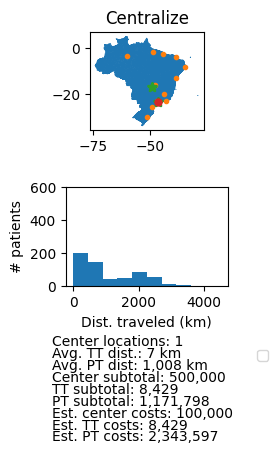

<Figure size 1200x1200 with 0 Axes>

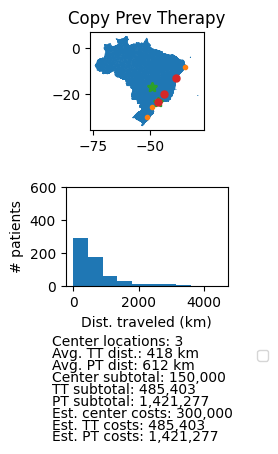

<Figure size 1200x1200 with 0 Axes>

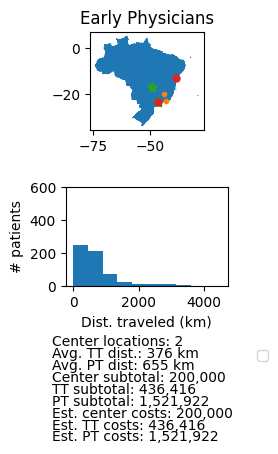

<Figure size 1200x1200 with 0 Axes>

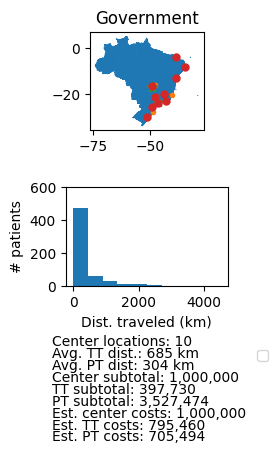

<Figure size 1200x1200 with 0 Axes>

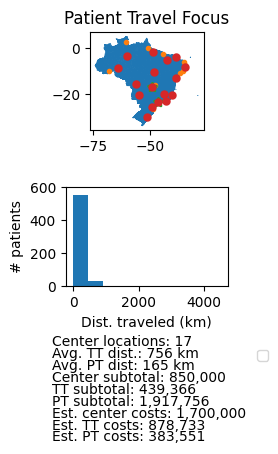

In [ ]:
# Accessing the saved outputs
for approach in approaches:
  treatment_centers = process_treatment_center_data(approach["tc_filename"])
  outputs = np.load("municipality_" + approach["title"] + "_outputs.npy", allow_pickle=True).item()
  plot_one_result_with_all_metrics(patient_populations, treatment_centers, starting_points, outputs, all_medium, bins=10, mark_patient_populations=False)
  plt.savefig("Approaches_Municipalities_" + approach["title"] + ".png")

In [ ]:
tc_candidate_filenames = {"Top 15 Cities": top_15_cities_tc_filename,
                          "4 Main Cities": main_4_cities_tc_filname,
                          "Biggest City in Each State": biggest_city_every_state_tc_filename,
                          "Reference Center Cities": reference_center_cities_tc_filename,
                          "Previous GT Cities": prev_gene_therapy_tc_filename}

In [ ]:
tc_candidate_filenames = {"Reference Center Cities": reference_center_cities_tc_filename,
                          "Previous GT Cities": prev_gene_therapy_tc_filename,
                          "Biggest City in Each State": biggest_city_every_state_tc_filename}

<Figure size 2100x2100 with 0 Axes>

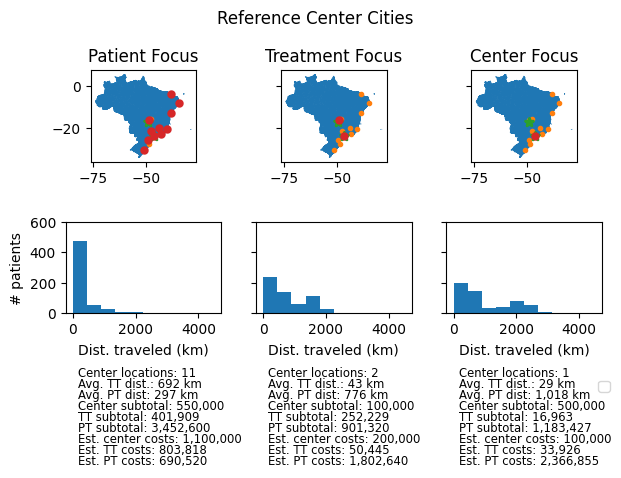

<Figure size 2100x2100 with 0 Axes>

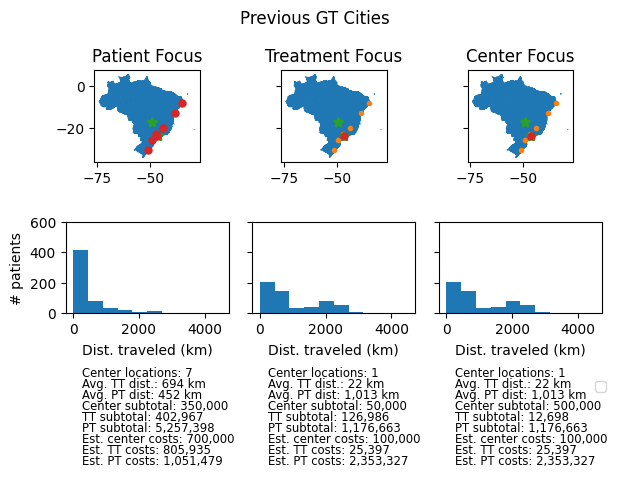

<Figure size 2100x2100 with 0 Axes>

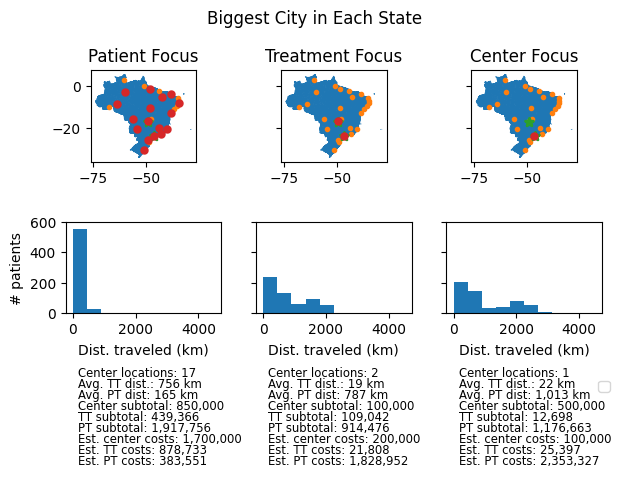

In [ ]:
# Generate levels, focuses comparisons for each candidate locations list
for title, tc_filename in tc_candidate_filenames.items():
  treatment_centers = process_treatment_center_data(tc_filename)
  outputs1, outputs2, outputs3 = run_parameter_sets_comparison(patient_populations, treatment_centers, starting_points,
                                                               #all_high, all_medium, all_low)
                                                               patient_travel_focused, treatment_transport_focused, center_fixed_cost_focused)
  plot_three_results_with_all_metrics(patient_populations, treatment_centers, starting_points, outputs1, outputs2, outputs3, all_medium, bins=10, super_title=title,
                       mark_patient_populations=False)
  plt.savefig("Municipality_Focuses_" + title + ".png")
  #plt.savefig("Levels_" + title + ".png")


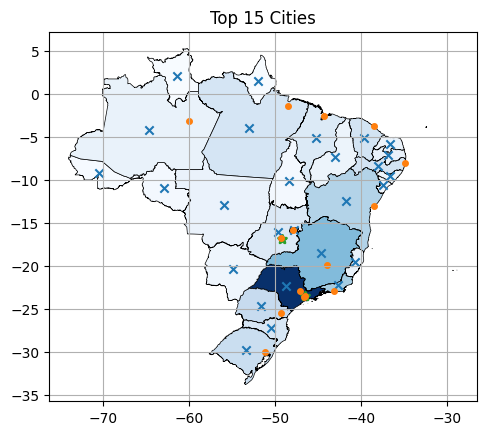

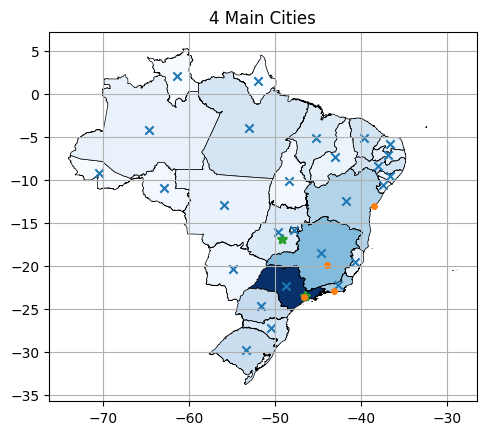

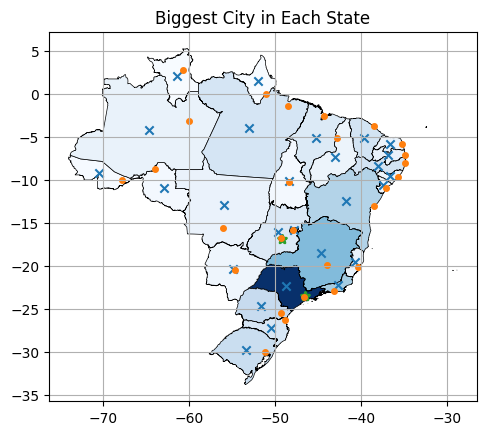

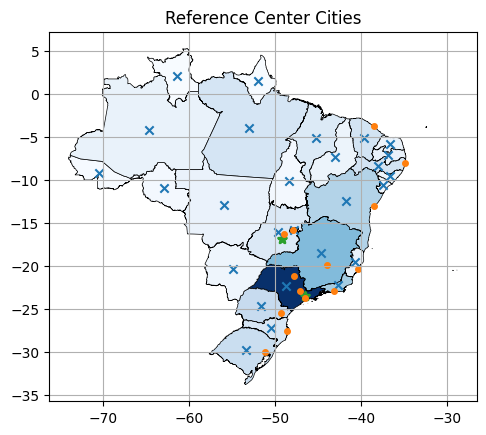

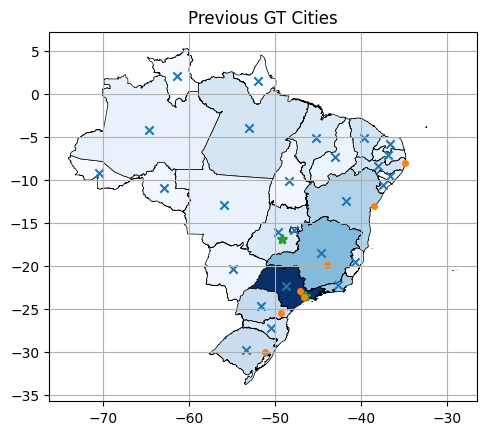

In [ ]:
# Plot candidate locations
for title, tc_filename in tc_candidate_filenames.items():
  treatment_centers = process_treatment_center_data(tc_filename)
  plot_inputs_map(patient_populations, treatment_centers, starting_points, title)
  plt.savefig("Candidate Locations_" + title + ".png")

<Figure size 1200x1200 with 0 Axes>

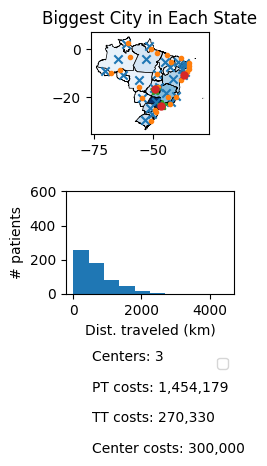

<Figure size 1200x1200 with 0 Axes>

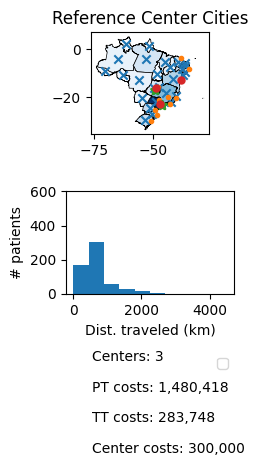

<Figure size 1200x1200 with 0 Axes>

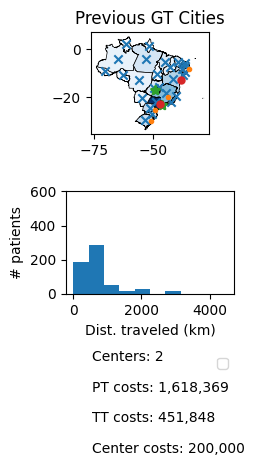

In [ ]:
# All medium for each candidate locations list
for title, tc_filename in tc_candidate_filenames.items():
  treatment_centers = process_treatment_center_data(tc_filename)
  inputs_dict = all_medium.copy()
  inputs_dict["title"] = title
  outputs = run_one_parameter_set(patient_populations, treatment_centers, starting_points, inputs_dict)
  plot_one_result(patient_populations, treatment_centers, starting_points, outputs, mark_patient_populations=True)
  #plt.savefig("Focuses_" + title + ".png")

In [ ]:
inputs_dict = {"tc_filename": prev_gene_therapy_tc_filename,
              "patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["MEDIUM"],
              "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["MEDIUM"],
              "cost_per_treatment_center": costs_per_treatment_center["LOW"],
              "title": "Previous GT Cities"}

In [ ]:
inputs_dict = {"tc_filename": biggest_city_every_state_tc_filename,
              "patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["MEDIUM"],
              "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["LOW"],
              "cost_per_treatment_center": costs_per_treatment_center["LOW"],
              "title": "Each State, C:LOW, T:LOW, P:MEDIUM"}

{'tc_filename': 'Brazil Gene Therapy Center Candidates - Biggest City in Every State.csv', 'patient_travel_cost_per_unit_dist': 4, 'treatment_transport_cost_per_unit_dist': 1, 'cost_per_treatment_center': 50000, 'title': 'Each State, C:LOW, T:LOW, P:MEDIUM'}
{'patient_travel_cost_per_unit_dist': 4, 'treatment_transport_cost_per_unit_dist': 2, 'cost_per_treatment_center': 100000, 'title': 'All medium'}


<Figure size 1200x1200 with 0 Axes>

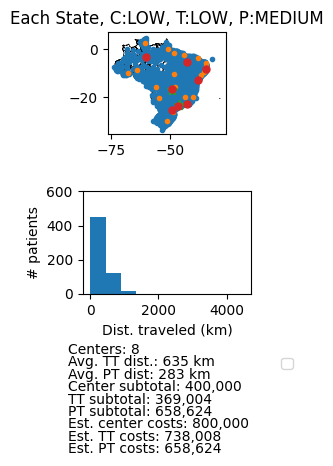

In [ ]:
# Run one
print(inputs_dict)
print(best_guess_parameters)
treatment_centers = process_treatment_center_data(inputs_dict["tc_filename"])
outputs = run_one_parameter_set(patient_populations, treatment_centers, starting_points, inputs_dict)
plot_one_result_with_all_metrics(patient_populations, treatment_centers, starting_points, outputs, best_guess_parameters, bins=10, mark_patient_populations=False)
plt.savefig(inputs_dict["title"] + "_Municipalities_" + ".png")

In [ ]:
tc_candidate_filenames = {"Ref. Cent.": reference_center_cities_tc_filename,
                          "Prev. GT": prev_gene_therapy_tc_filename,
                          "Each State": biggest_city_every_state_tc_filename}

In [ ]:
tc_candidate_filenames = {"15 Biggest": top_15_cities_tc_filename,
                          "4 Main": main_4_cities_tc_filname}

In [ ]:
tc_candidate_filenames = {"4 Main": main_4_cities_tc_filname,
                          "Prev. GT": prev_gene_therapy_tc_filename,
                          "15 Biggest": top_15_cities_tc_filename,
                          "Ref. Cent.": reference_center_cities_tc_filename,
                          "Each State": biggest_city_every_state_tc_filename}

<ipython-input-156-c1bf2b786363>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 12))


<Figure size 1200x1200 with 0 Axes>

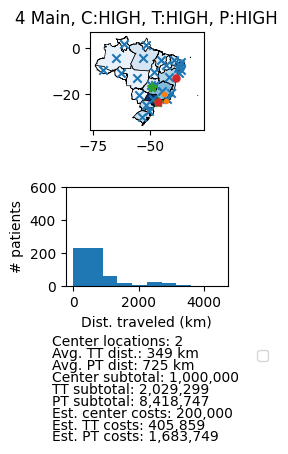

<Figure size 1200x1200 with 0 Axes>

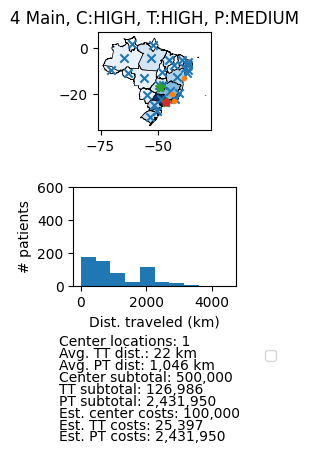

<Figure size 1200x1200 with 0 Axes>

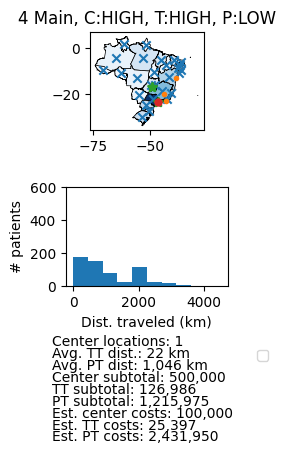

<Figure size 1200x1200 with 0 Axes>

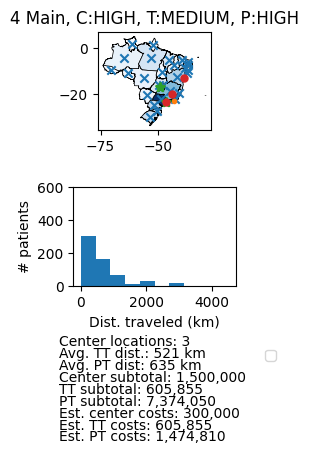

<Figure size 1200x1200 with 0 Axes>

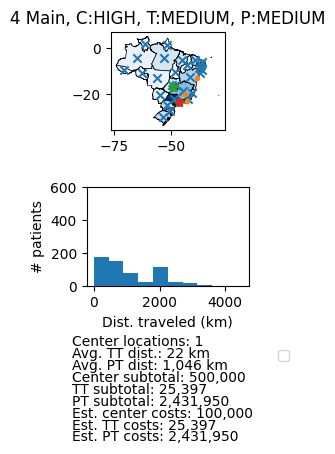

<Figure size 1200x1200 with 0 Axes>

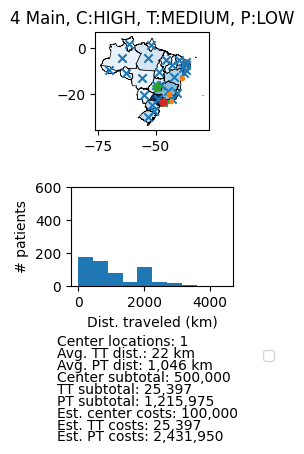

<Figure size 1200x1200 with 0 Axes>

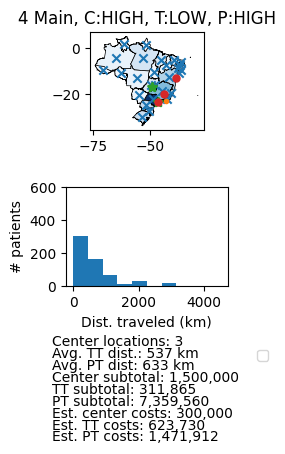

<Figure size 1200x1200 with 0 Axes>

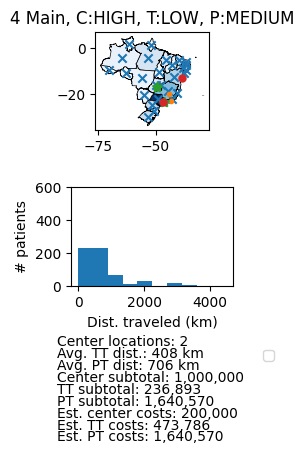

<Figure size 1200x1200 with 0 Axes>

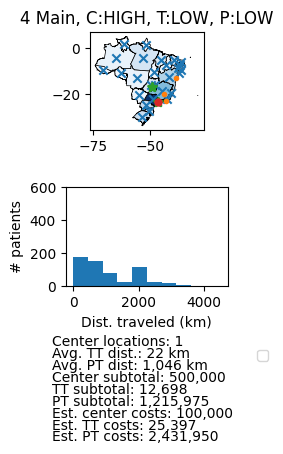

<Figure size 1200x1200 with 0 Axes>

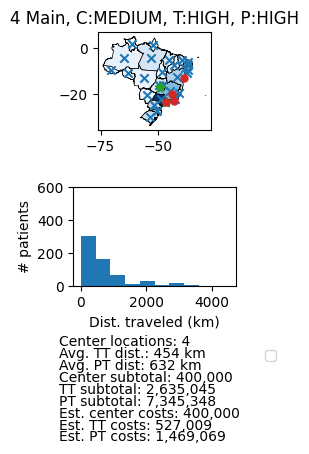

<Figure size 1200x1200 with 0 Axes>

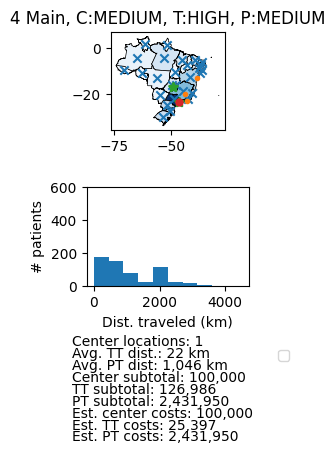

<Figure size 1200x1200 with 0 Axes>

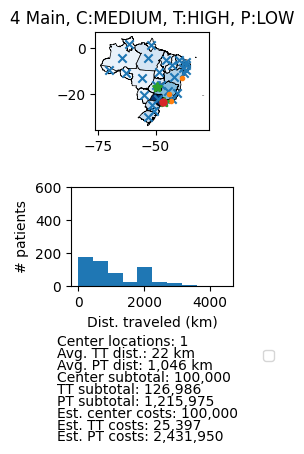

<Figure size 1200x1200 with 0 Axes>

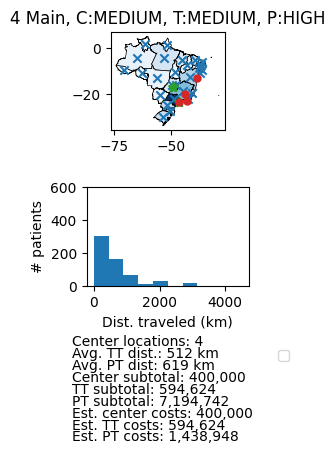

<Figure size 1200x1200 with 0 Axes>

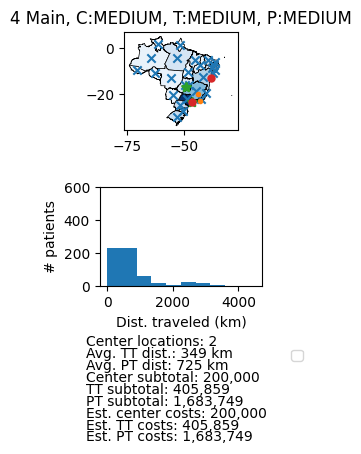

<Figure size 1200x1200 with 0 Axes>

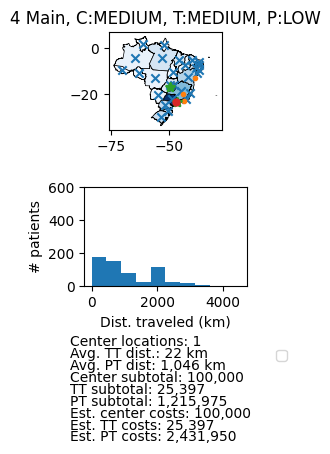

<Figure size 1200x1200 with 0 Axes>

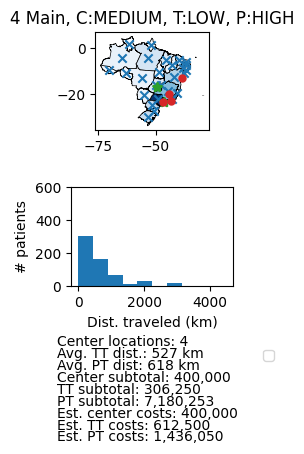

<Figure size 1200x1200 with 0 Axes>

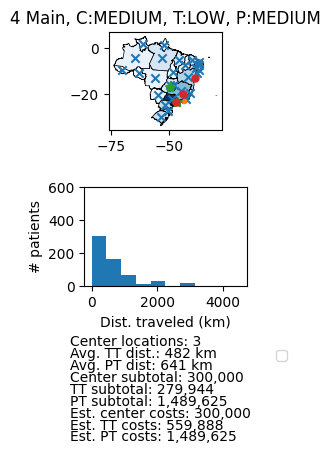

<Figure size 1200x1200 with 0 Axes>

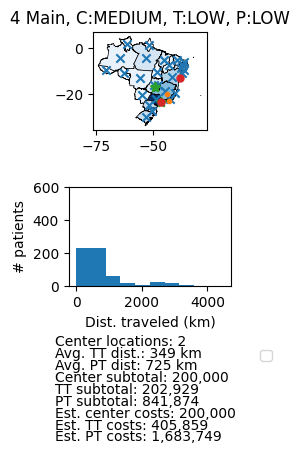

<Figure size 1200x1200 with 0 Axes>

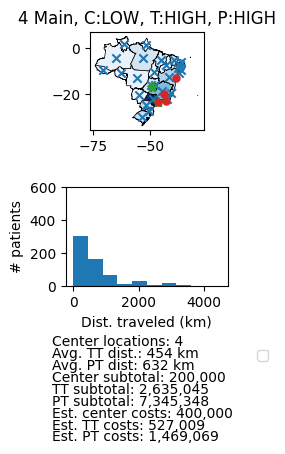

<Figure size 1200x1200 with 0 Axes>

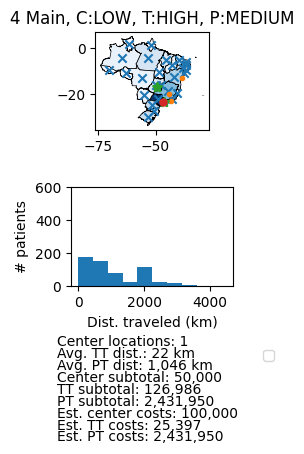

<Figure size 1200x1200 with 0 Axes>

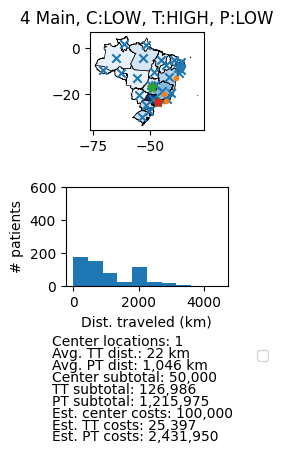

<Figure size 1200x1200 with 0 Axes>

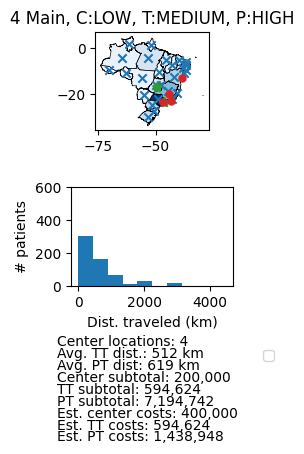

<Figure size 1200x1200 with 0 Axes>

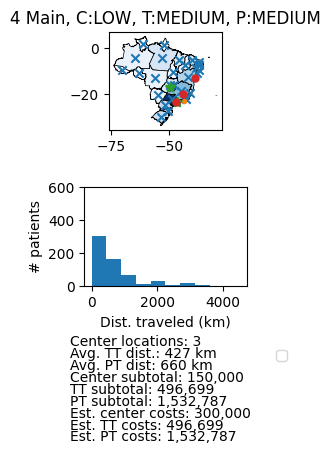

<Figure size 1200x1200 with 0 Axes>

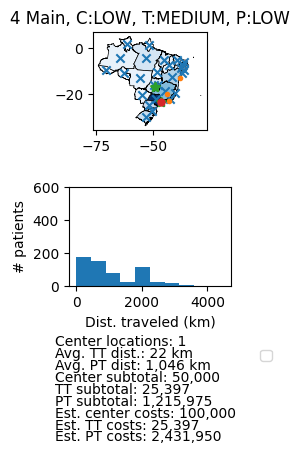

<Figure size 1200x1200 with 0 Axes>

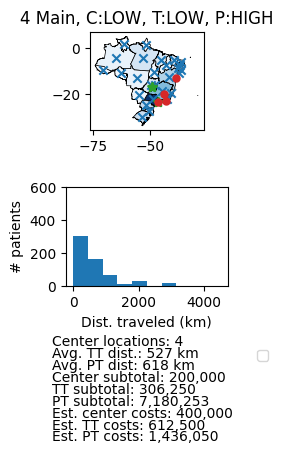

<Figure size 1200x1200 with 0 Axes>

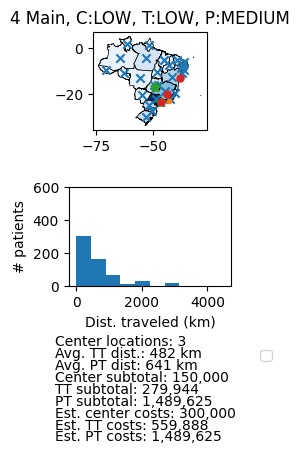

<Figure size 1200x1200 with 0 Axes>

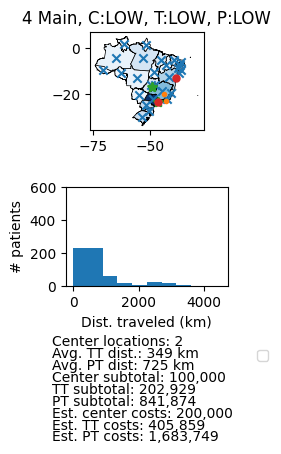

<Figure size 1200x1200 with 0 Axes>

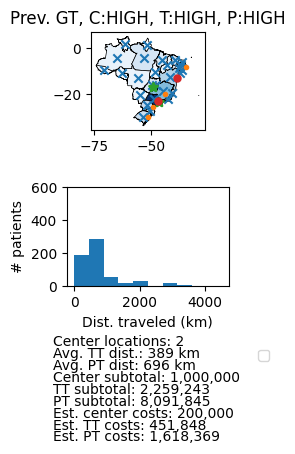

<Figure size 1200x1200 with 0 Axes>

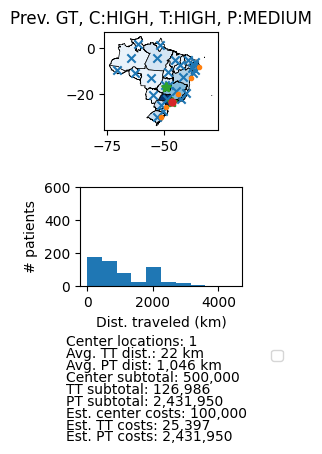

<Figure size 1200x1200 with 0 Axes>

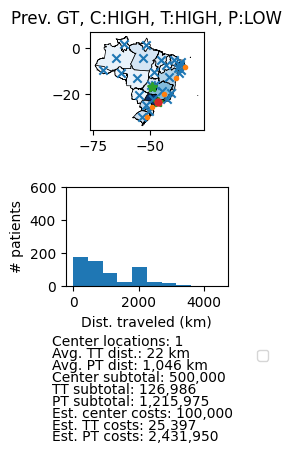

<Figure size 1200x1200 with 0 Axes>

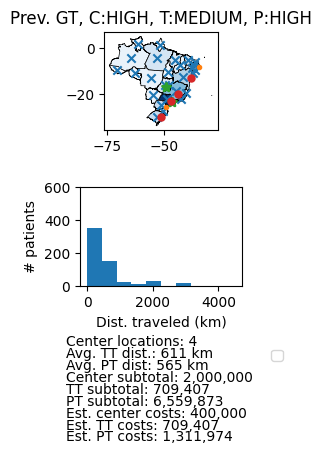

<Figure size 1200x1200 with 0 Axes>

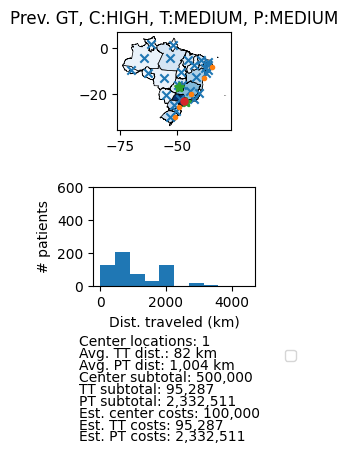

<Figure size 1200x1200 with 0 Axes>

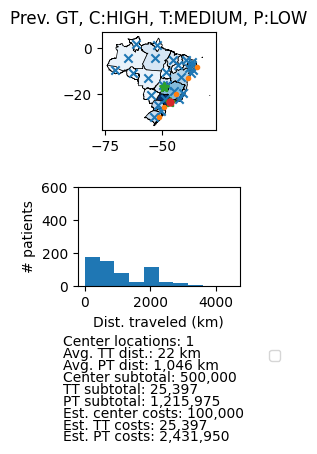

<Figure size 1200x1200 with 0 Axes>

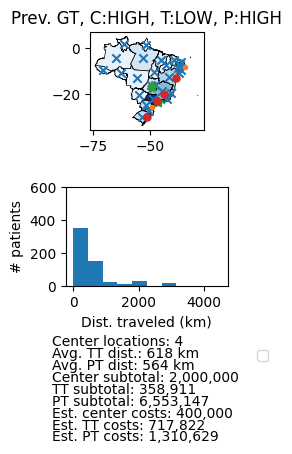

<Figure size 1200x1200 with 0 Axes>

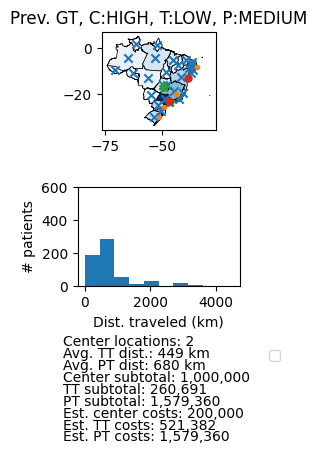

<Figure size 1200x1200 with 0 Axes>

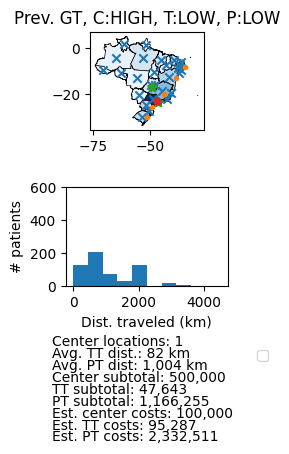

<Figure size 1200x1200 with 0 Axes>

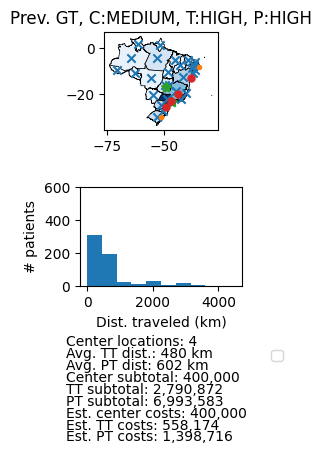

<Figure size 1200x1200 with 0 Axes>

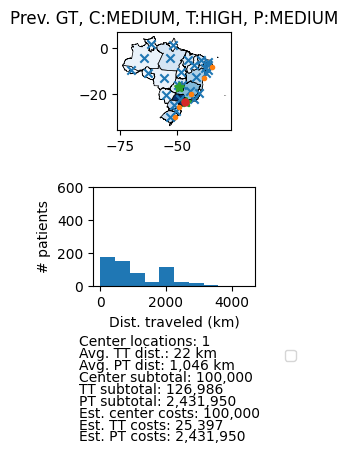

<Figure size 1200x1200 with 0 Axes>

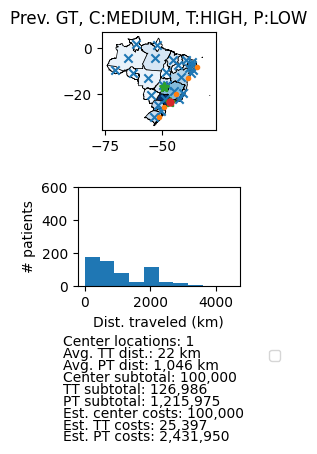

<Figure size 1200x1200 with 0 Axes>

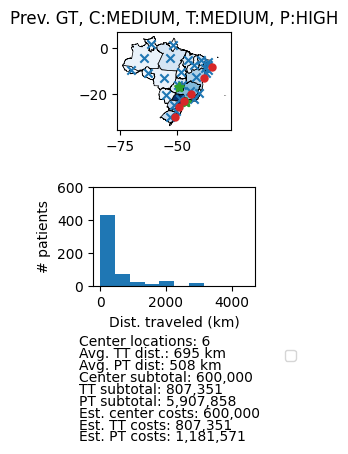

<Figure size 1200x1200 with 0 Axes>

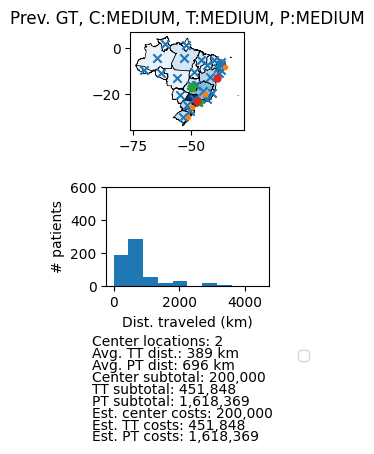

<Figure size 1200x1200 with 0 Axes>

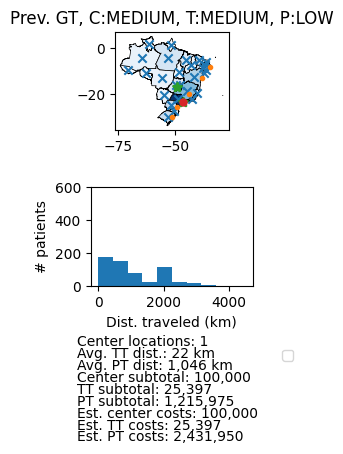

<Figure size 1200x1200 with 0 Axes>

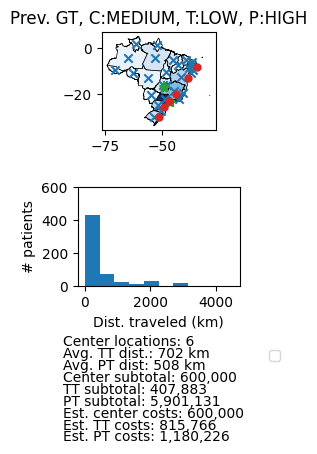

<Figure size 1200x1200 with 0 Axes>

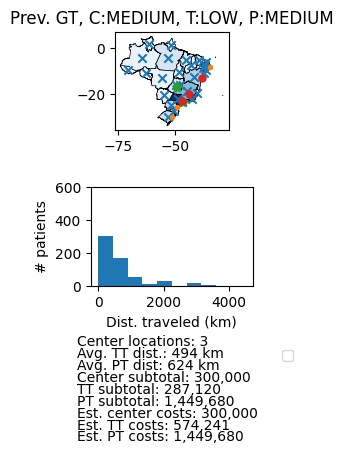

<Figure size 1200x1200 with 0 Axes>

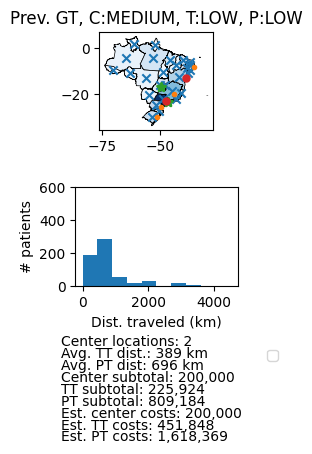

<Figure size 1200x1200 with 0 Axes>

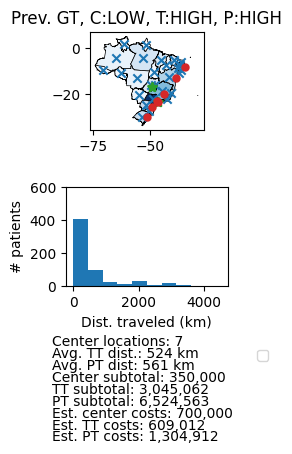

<Figure size 1200x1200 with 0 Axes>

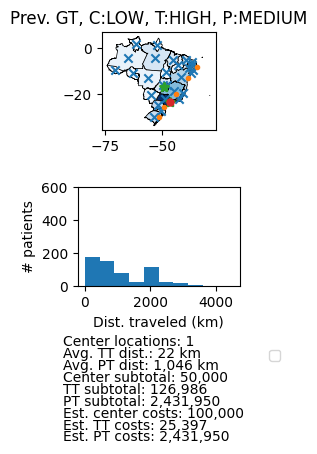

<Figure size 1200x1200 with 0 Axes>

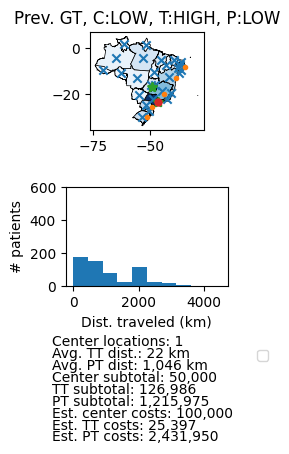

<Figure size 1200x1200 with 0 Axes>

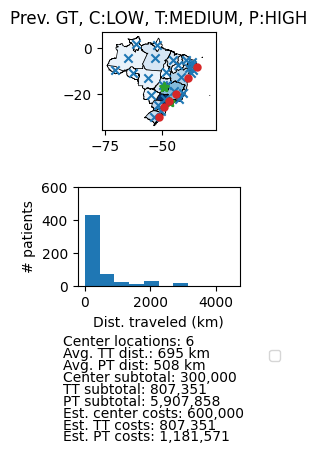

<Figure size 1200x1200 with 0 Axes>

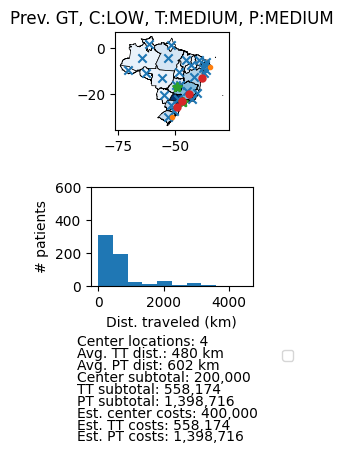

<Figure size 1200x1200 with 0 Axes>

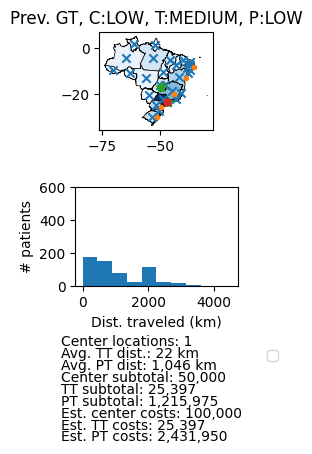

<Figure size 1200x1200 with 0 Axes>

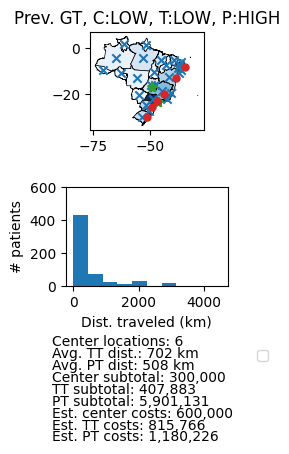

<Figure size 1200x1200 with 0 Axes>

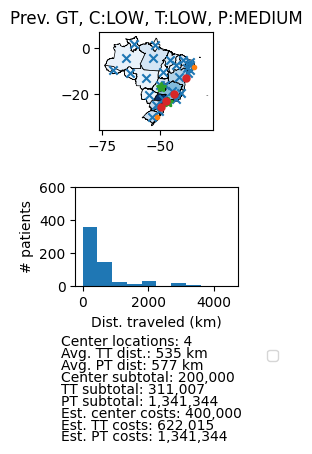

<Figure size 1200x1200 with 0 Axes>

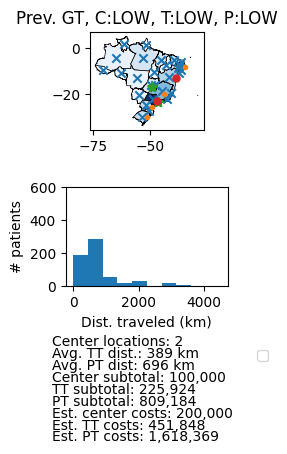

<Figure size 1200x1200 with 0 Axes>

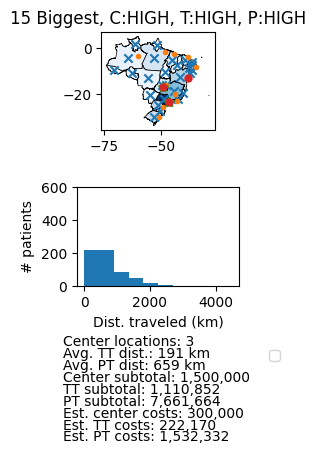

<Figure size 1200x1200 with 0 Axes>

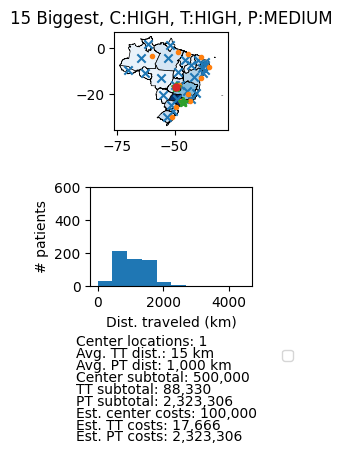

<Figure size 1200x1200 with 0 Axes>

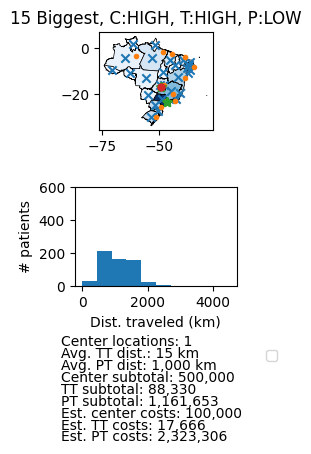

<Figure size 1200x1200 with 0 Axes>

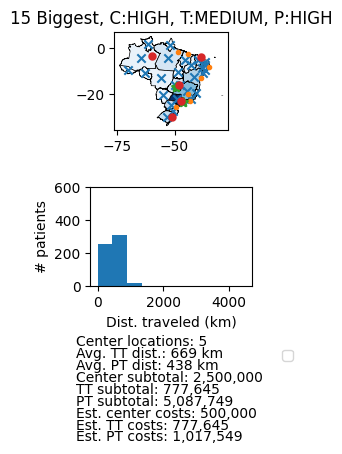

<Figure size 1200x1200 with 0 Axes>

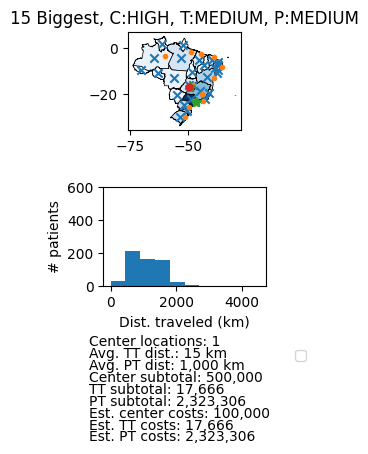

<Figure size 1200x1200 with 0 Axes>

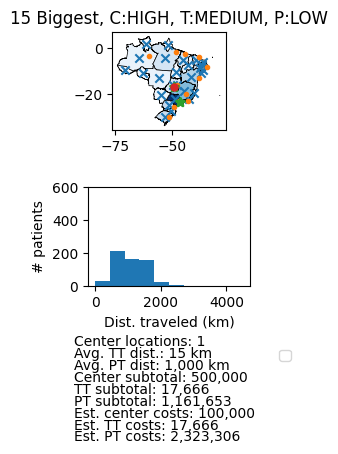

<Figure size 1200x1200 with 0 Axes>

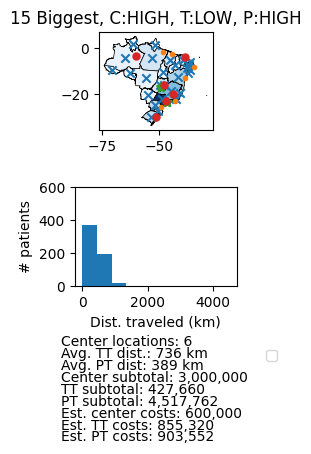

<Figure size 1200x1200 with 0 Axes>

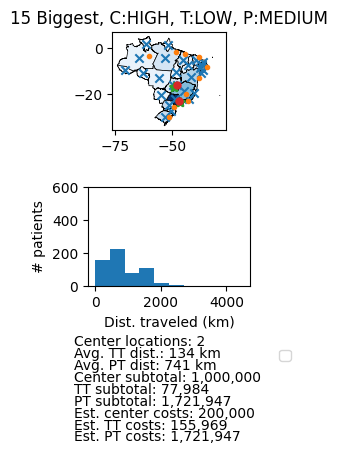

<Figure size 1200x1200 with 0 Axes>

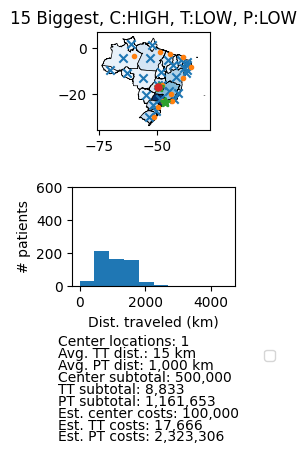

<Figure size 1200x1200 with 0 Axes>

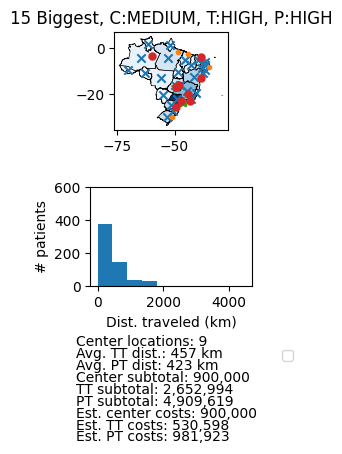

<Figure size 1200x1200 with 0 Axes>

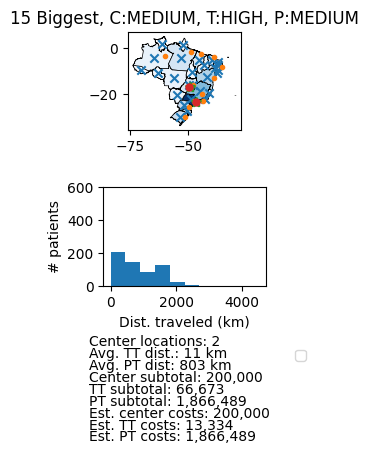

<Figure size 1200x1200 with 0 Axes>

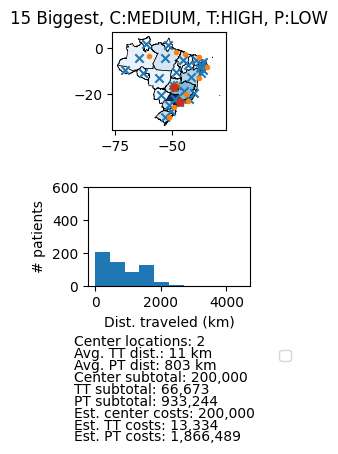

<Figure size 1200x1200 with 0 Axes>

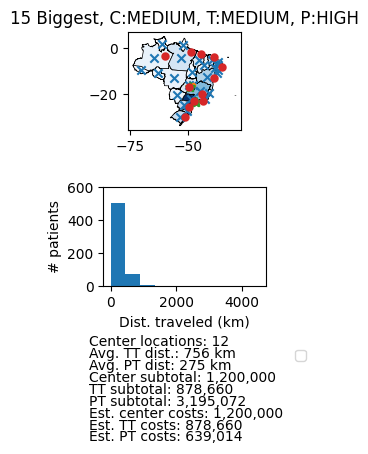

<Figure size 1200x1200 with 0 Axes>

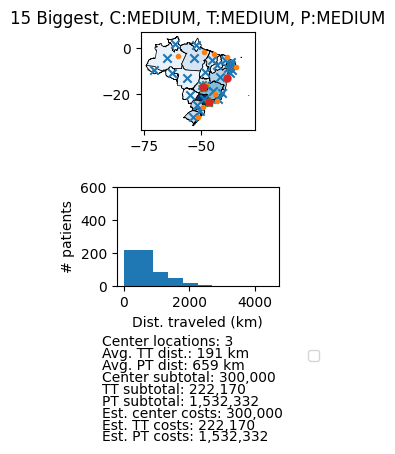

<Figure size 1200x1200 with 0 Axes>

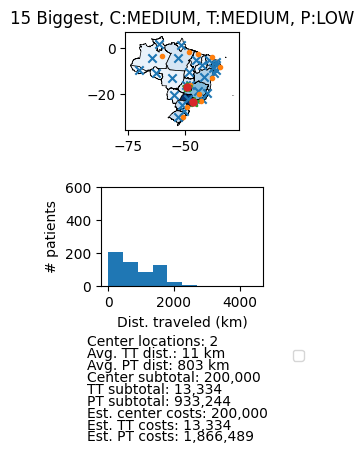

<Figure size 1200x1200 with 0 Axes>

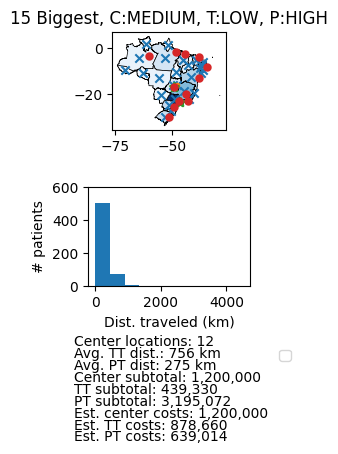

<Figure size 1200x1200 with 0 Axes>

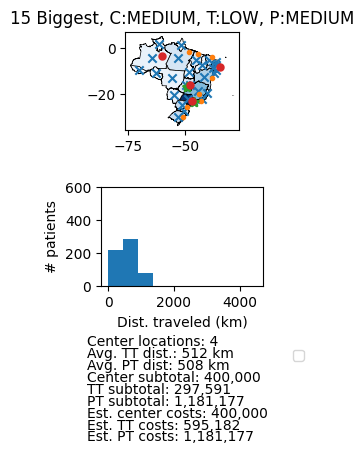

<Figure size 1200x1200 with 0 Axes>

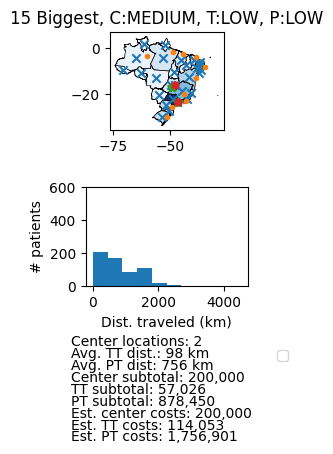

<Figure size 1200x1200 with 0 Axes>

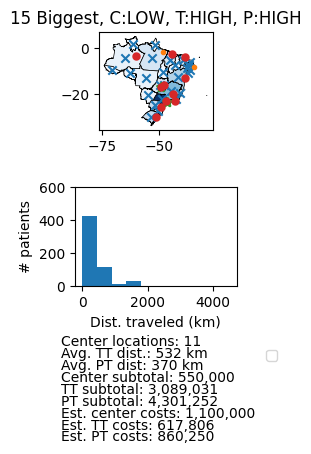

<Figure size 1200x1200 with 0 Axes>

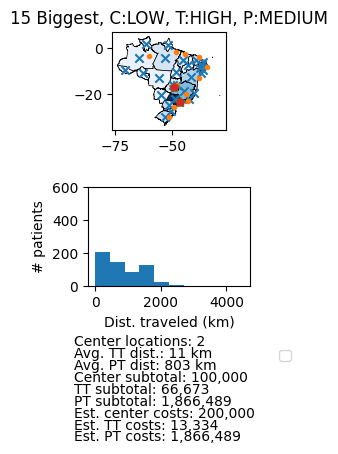

<Figure size 1200x1200 with 0 Axes>

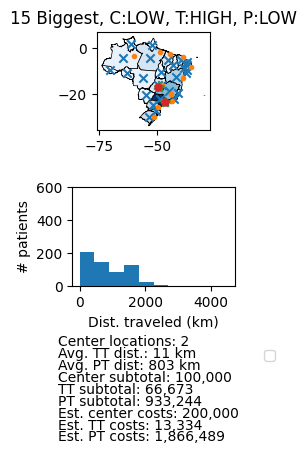

<Figure size 1200x1200 with 0 Axes>

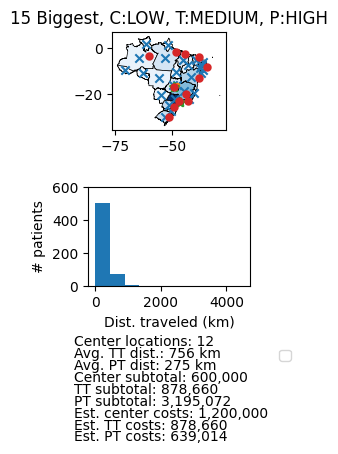

<Figure size 1200x1200 with 0 Axes>

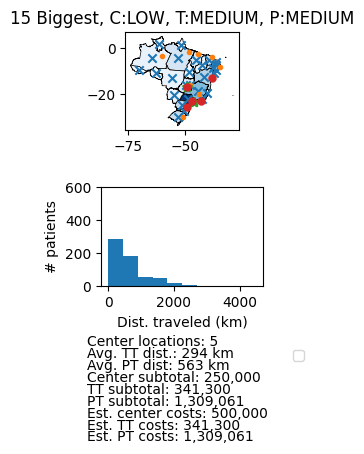

<Figure size 1200x1200 with 0 Axes>

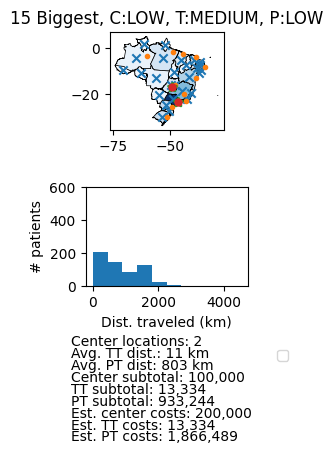

<Figure size 1200x1200 with 0 Axes>

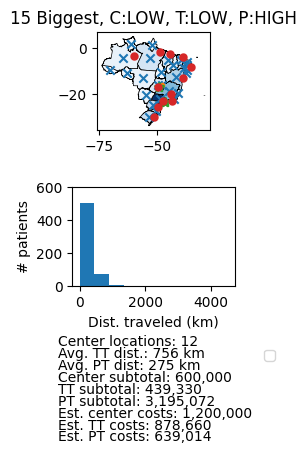

<Figure size 1200x1200 with 0 Axes>

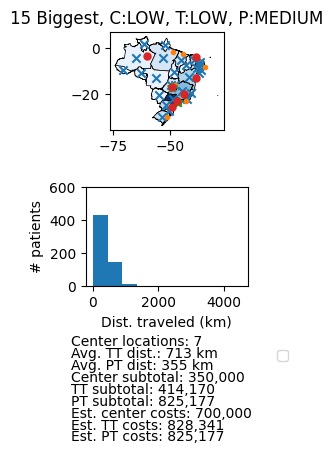

<Figure size 1200x1200 with 0 Axes>

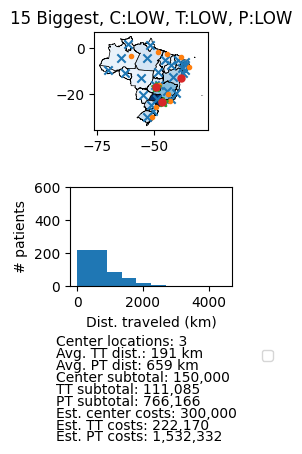

<Figure size 1200x1200 with 0 Axes>

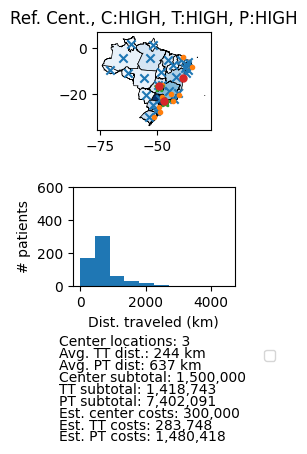

<Figure size 1200x1200 with 0 Axes>

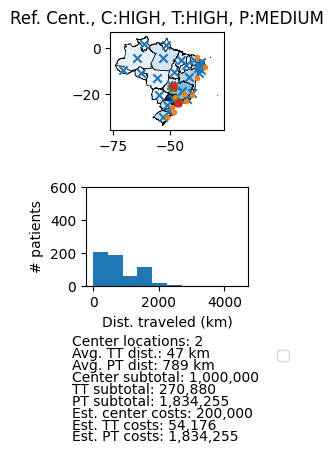

<Figure size 1200x1200 with 0 Axes>

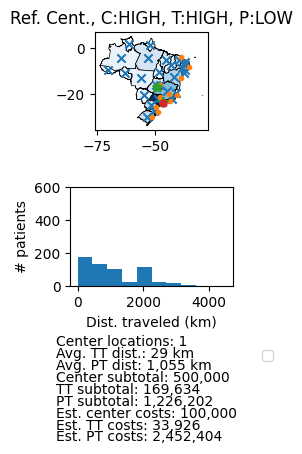

<Figure size 1200x1200 with 0 Axes>

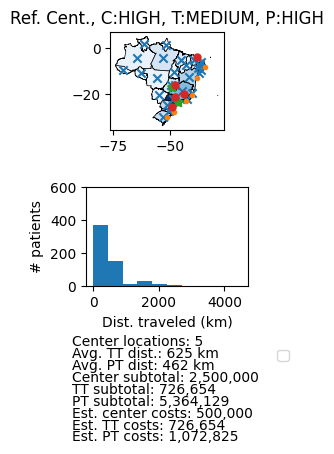

<Figure size 1200x1200 with 0 Axes>

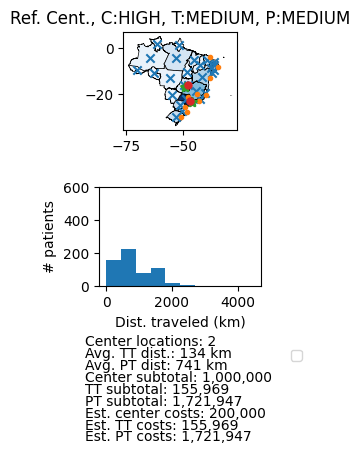

<Figure size 1200x1200 with 0 Axes>

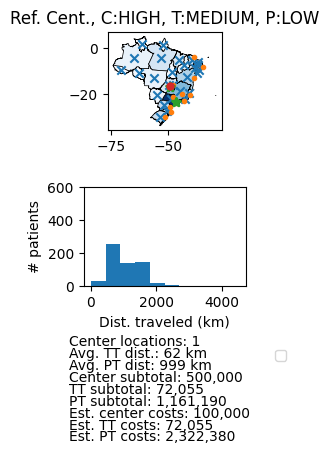

<Figure size 1200x1200 with 0 Axes>

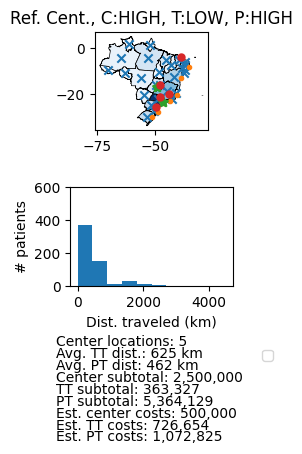

<Figure size 1200x1200 with 0 Axes>

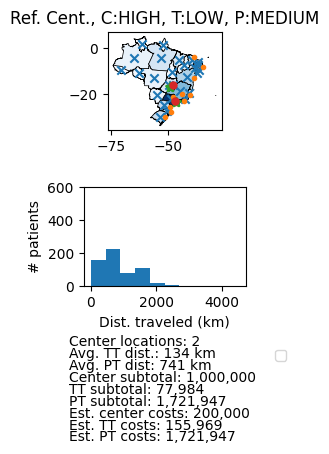

<Figure size 1200x1200 with 0 Axes>

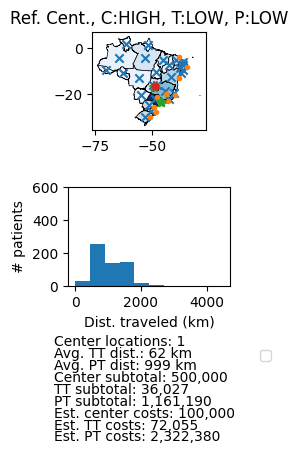

<Figure size 1200x1200 with 0 Axes>

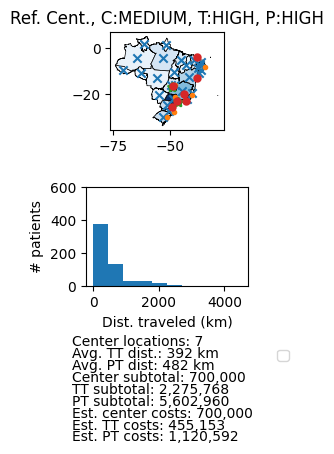

<Figure size 1200x1200 with 0 Axes>

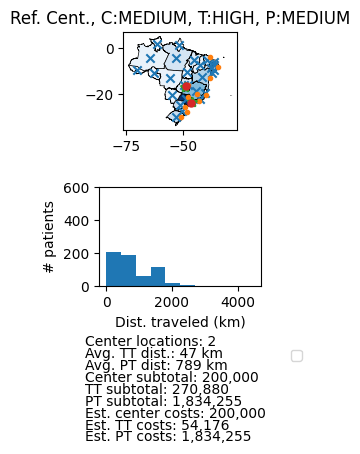

<Figure size 1200x1200 with 0 Axes>

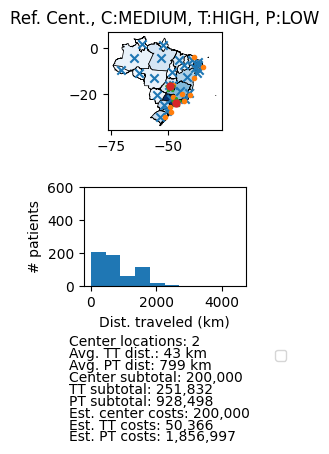

<Figure size 1200x1200 with 0 Axes>

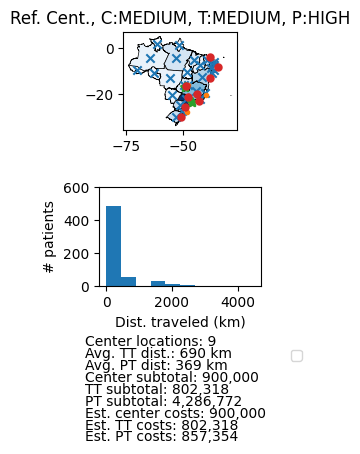

<Figure size 1200x1200 with 0 Axes>

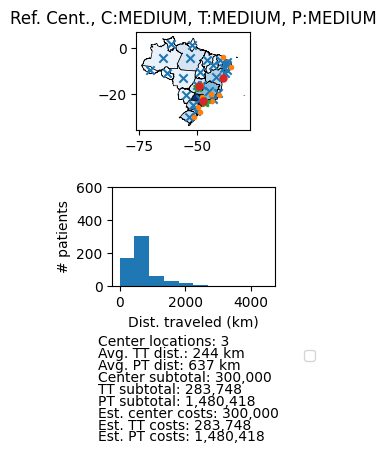

<Figure size 1200x1200 with 0 Axes>

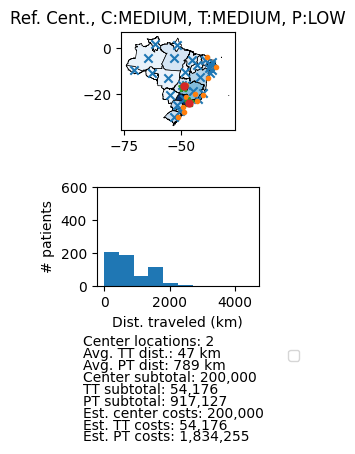

<Figure size 1200x1200 with 0 Axes>

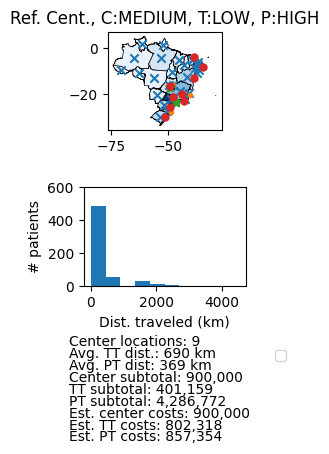

<Figure size 1200x1200 with 0 Axes>

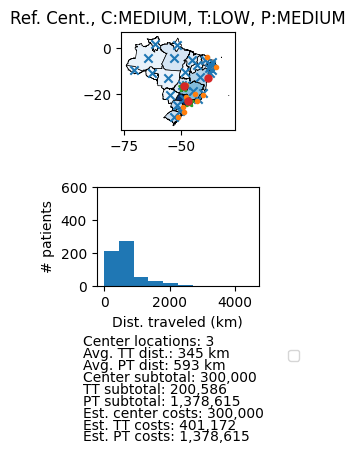

<Figure size 1200x1200 with 0 Axes>

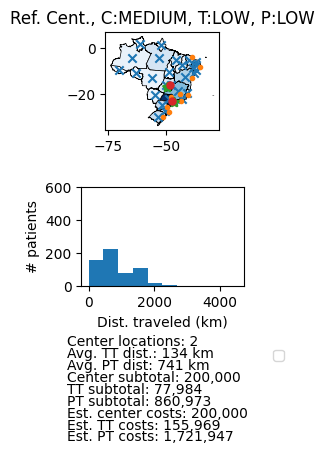

<Figure size 1200x1200 with 0 Axes>

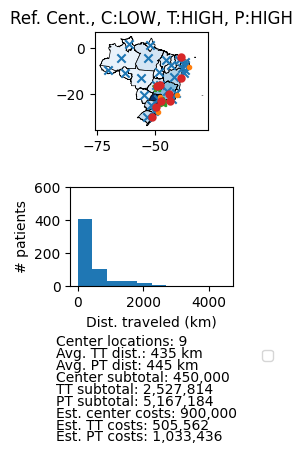

<Figure size 1200x1200 with 0 Axes>

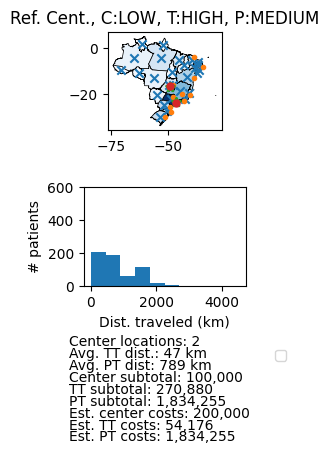

<Figure size 1200x1200 with 0 Axes>

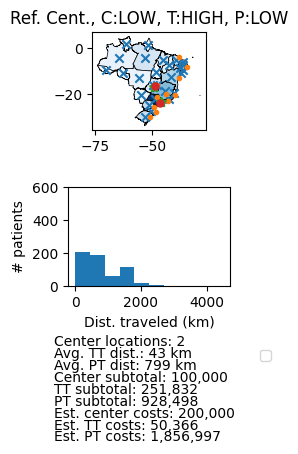

<Figure size 1200x1200 with 0 Axes>

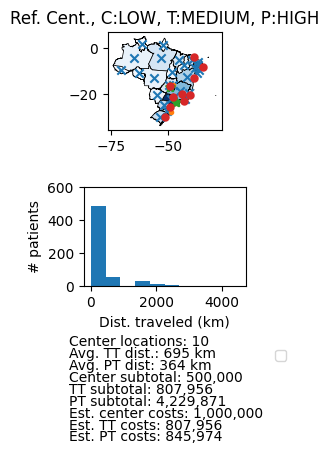

<Figure size 1200x1200 with 0 Axes>

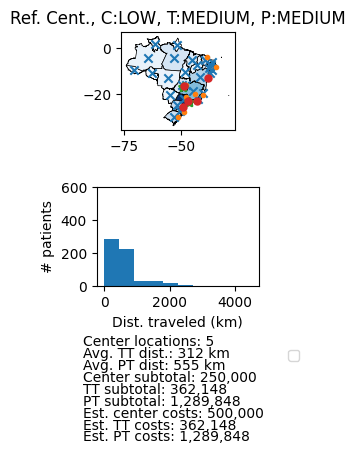

<Figure size 1200x1200 with 0 Axes>

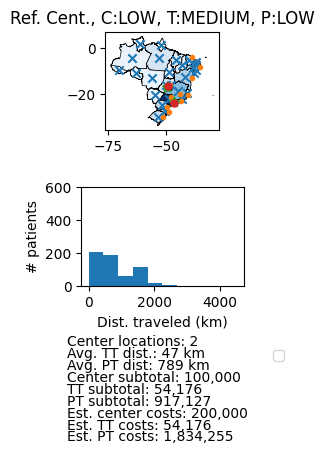

<Figure size 1200x1200 with 0 Axes>

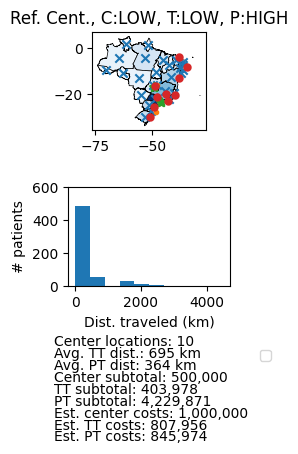

<Figure size 1200x1200 with 0 Axes>

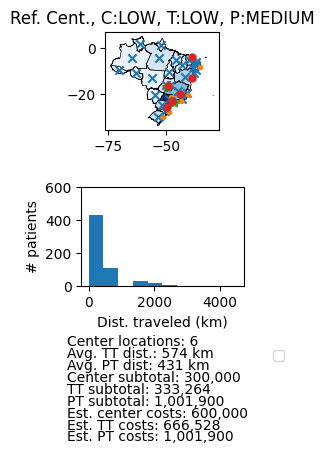

<Figure size 1200x1200 with 0 Axes>

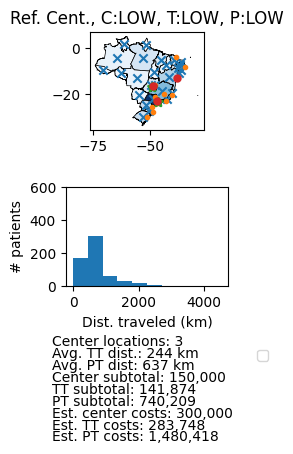

<Figure size 1200x1200 with 0 Axes>

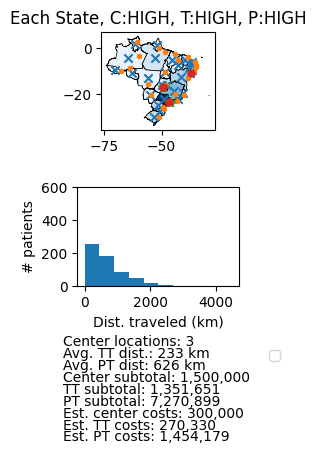

<Figure size 1200x1200 with 0 Axes>

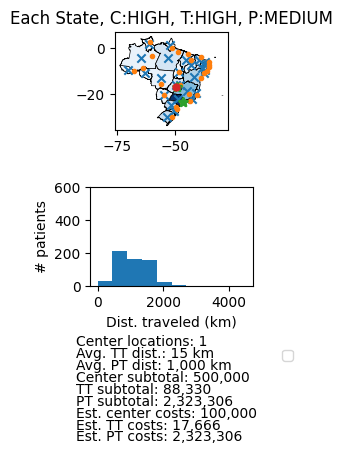

<Figure size 1200x1200 with 0 Axes>

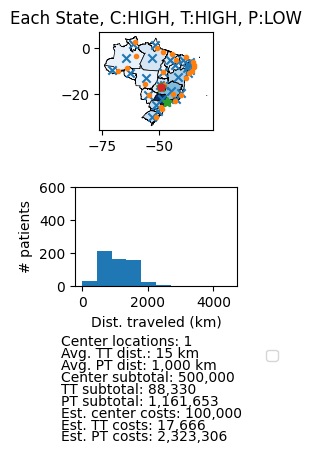

<Figure size 1200x1200 with 0 Axes>

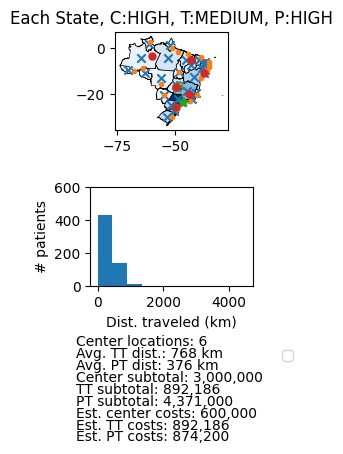

<Figure size 1200x1200 with 0 Axes>

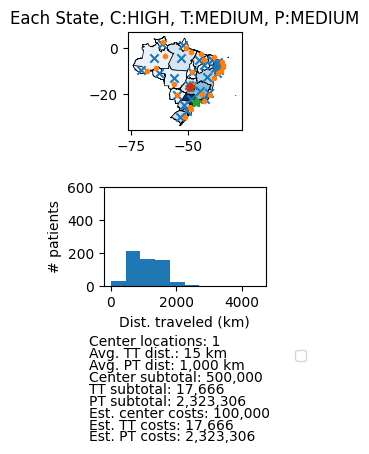

<Figure size 1200x1200 with 0 Axes>

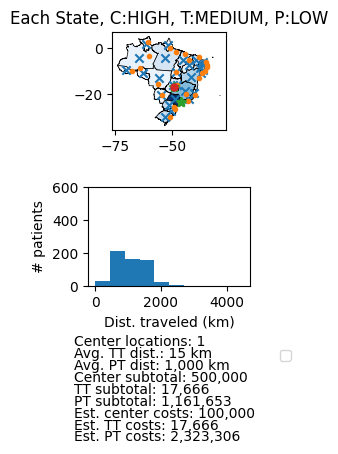

<Figure size 1200x1200 with 0 Axes>

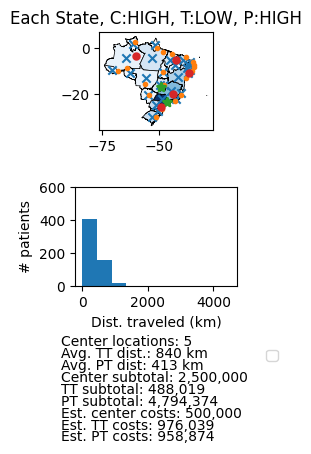

<Figure size 1200x1200 with 0 Axes>

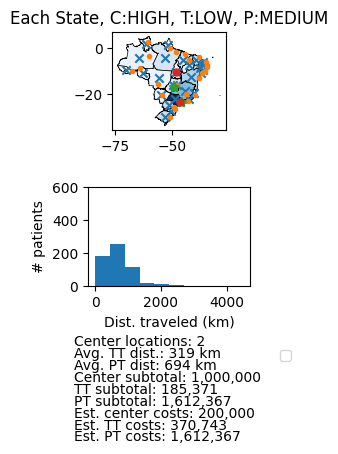

<Figure size 1200x1200 with 0 Axes>

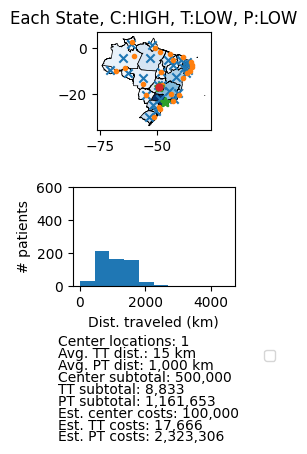

<Figure size 1200x1200 with 0 Axes>

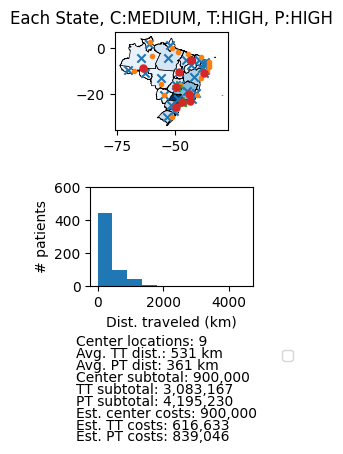

<Figure size 1200x1200 with 0 Axes>

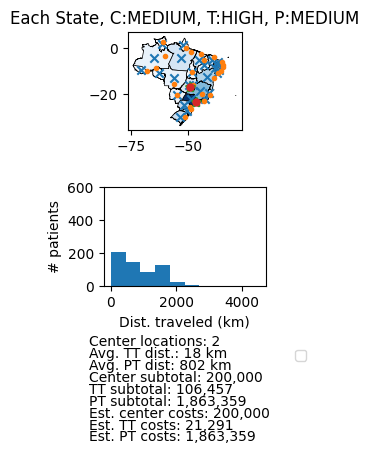

<Figure size 1200x1200 with 0 Axes>

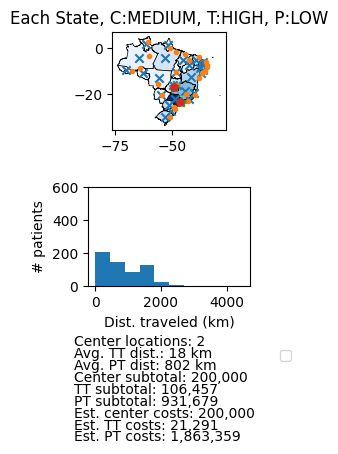

<Figure size 1200x1200 with 0 Axes>

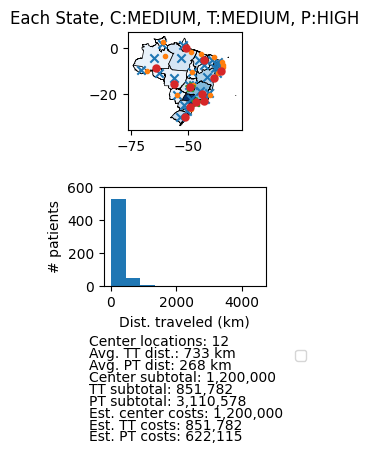

<Figure size 1200x1200 with 0 Axes>

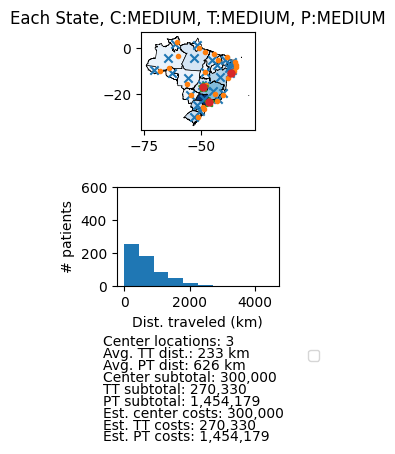

<Figure size 1200x1200 with 0 Axes>

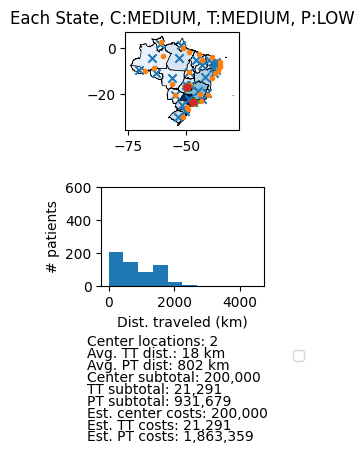

<Figure size 1200x1200 with 0 Axes>

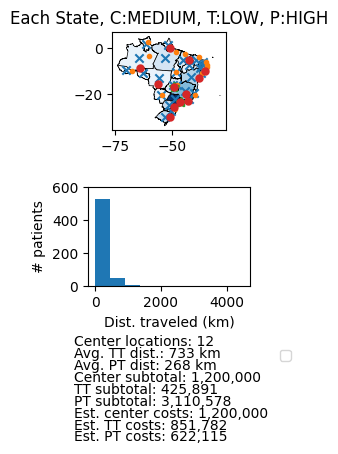

<Figure size 1200x1200 with 0 Axes>

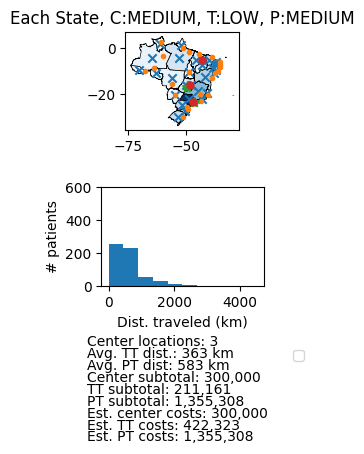

<Figure size 1200x1200 with 0 Axes>

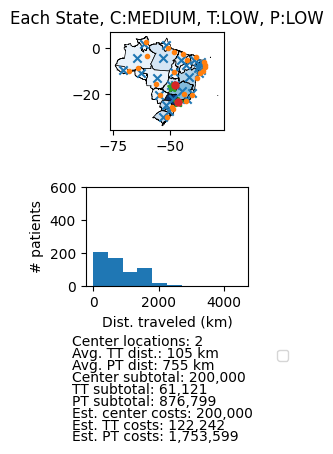

<Figure size 1200x1200 with 0 Axes>

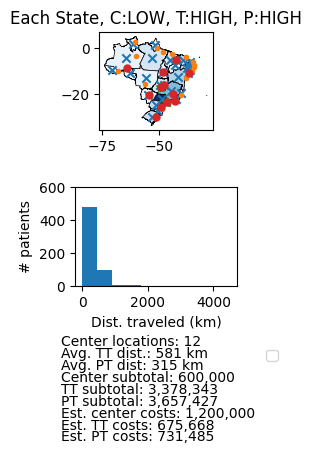

<Figure size 1200x1200 with 0 Axes>

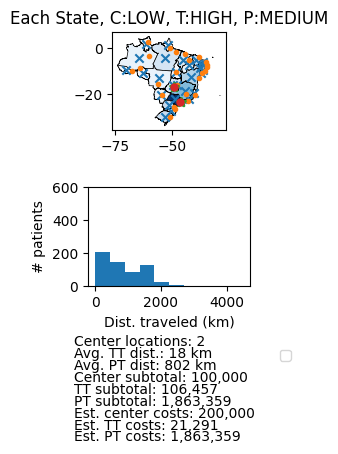

<Figure size 1200x1200 with 0 Axes>

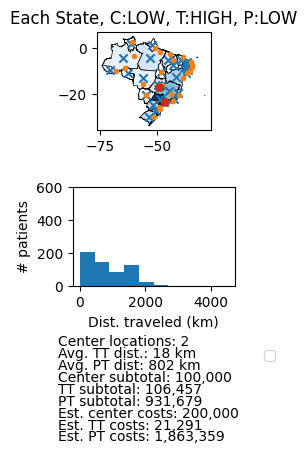

<Figure size 1200x1200 with 0 Axes>

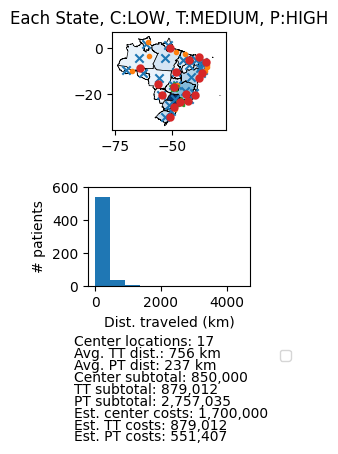

<Figure size 1200x1200 with 0 Axes>

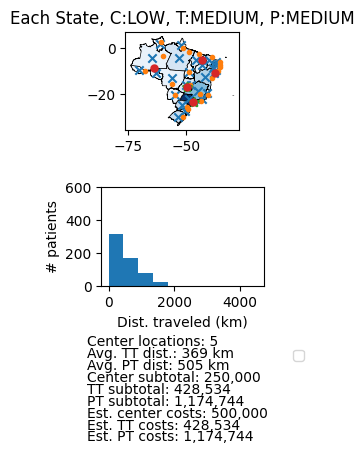

<Figure size 1200x1200 with 0 Axes>

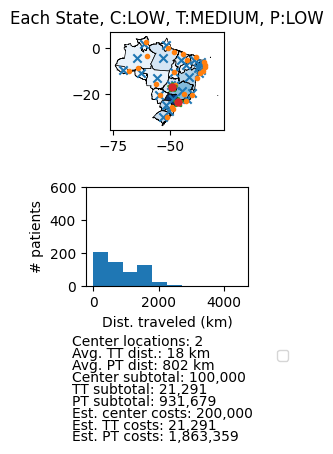

<Figure size 1200x1200 with 0 Axes>

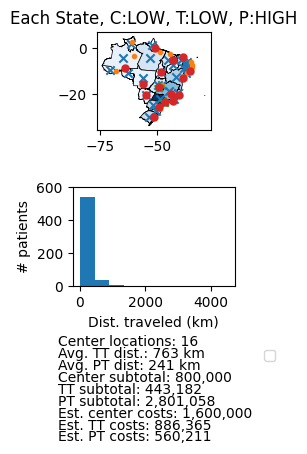

<Figure size 1200x1200 with 0 Axes>

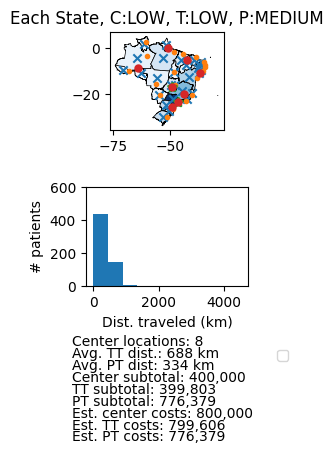

<Figure size 1200x1200 with 0 Axes>

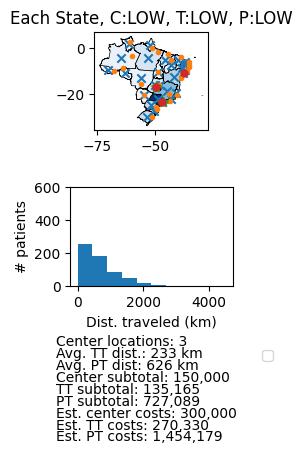

In [ ]:
# Code to run 81 approaches and save all the info in a pandas df
hml = ["HIGH", "MEDIUM", "LOW"]
results_df = pd.DataFrame(columns=["title", "num_centers_opened", "avg_treatment_transport_dist", "avg_patient_travel_dist"])
for title, filename in tc_candidate_filenames.items():
  for center_cost in hml:
    for tt_cost in hml:
      for pt_cost in hml:
        inputs_dict = {}
        inputs_dict["title"] = title + ", C:" + center_cost + ", T:" + tt_cost + ", P:" + pt_cost
        inputs_dict["tc_filename"] = filename
        inputs_dict["patient_travel_cost_per_unit_dist"] = patient_travel_costs_per_unit_dist[pt_cost]
        inputs_dict["treatment_transport_cost_per_unit_dist"] = treatment_transport_costs_per_unit_dist[tt_cost]
        inputs_dict["cost_per_treatment_center"] = costs_per_treatment_center[center_cost]

        treatment_centers = process_treatment_center_data(inputs_dict["tc_filename"])
        outputs = run_one_parameter_set(patient_populations, treatment_centers, starting_points, inputs_dict)
        best_guess_parameters = all_medium

        plot_one_result_with_all_metrics(patient_populations, treatment_centers, starting_points, outputs, best_guess_parameters, bins=10, mark_patient_populations=True)
        # Save result
        plt.savefig(inputs_dict["title"] + ".png")

        # add one row to the bottom of the dataframe
        results_df.loc[len(results_df.index)] = [inputs_dict["title"], int(outputs["num_centers_opened"]), int(round(outputs['avg_treatment_transport_dist'])), int(round(outputs['avg_patient_travel_dist']))]
#np.save("the_first_81_.npy", results_df)
results_df.to_csv('Results_135.csv', index=False)

In [ ]:
results_df

,title,candidate_center_filename,num_centers_opened,avg_treatment_transport_dist,avg_patient_travel_dist
0,"Ref. Cent., C:HIGH, T:HIGH, P:HIGH",Brazil Gene Therapy Center Candidates - Refere...,3.0,244.189947,637.013068
1,"Ref. Cent., C:HIGH, T:HIGH, P:MEDIUM",Brazil Gene Therapy Center Candidates - Refere...,2.0,46.623117,789.266664
2,"Ref. Cent., C:HIGH, T:HIGH, P:LOW",Brazil Gene Therapy Center Candidates - Refere...,1.0,29.196989,1055.251672
3,"Ref. Cent., C:HIGH, T:MEDIUM, P:HIGH",Brazil Gene Therapy Center Candidates - Refere...,5.0,625.347760,461.629049
4,"Ref. Cent., C:HIGH, T:MEDIUM, P:MEDIUM",Brazil Gene Therapy Center Candidates - Refere...,2.0,134.225358,740.941089
...,...,...,...,...,...
76,"Each State, C:LOW, T:MEDIUM, P:MEDIUM",Brazil Gene Therapy Center Candidates - Bigges...,5.0,368.790209,505.483690
77,"Each State, C:LOW, T:MEDIUM, P:LOW",Brazil Gene Therapy Center Candidates - Bigges...,2.0,18.323147,801.789947
78,"Each State, C:LOW, T:LOW, P:HIGH",Brazil Gene Therapy Center Candidates - Bigges...,16.0,762.792806,241.054966
79,"Each State, C:LOW, T:LOW, P:MEDIUM",Brazil Gene Therapy Center Candidates - Bigges...,8.0,688.129525,334.070524


In [ ]:
results_df.to_csv('Results_81.csv', index=False)

*Below is the code used for the interactive workshop in May 2024*

In [ ]:
tc_candidate_filenames = {"Biggest City in Each State": biggest_city_every_state_tc_filename,
                          "Reference Center Cities": reference_center_cities_tc_filename,
                          "Previous GT Cities": prev_gene_therapy_tc_filename}

In [ ]:
inputs_dict = {"tc_filename": biggest_city_every_state_tc_filename,
              "patient_travel_cost_per_unit_dist": patient_travel_costs_per_unit_dist["MEDIUM"],
              "treatment_transport_cost_per_unit_dist": treatment_transport_costs_per_unit_dist["LOW"],
              "cost_per_treatment_center": costs_per_treatment_center["MEDIUM"],
              "title": "Biggest City in Each State"}

<Figure size 1200x1200 with 0 Axes>

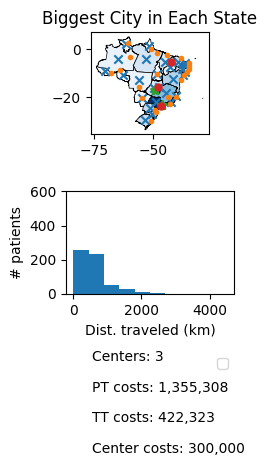

In [ ]:
treatment_centers = process_treatment_center_data(inputs_dict["tc_filename"])
outputs = run_one_parameter_set(patient_populations, treatment_centers, starting_points, inputs_dict)
plot_one_result_with_best_guess_parameters(patient_populations, treatment_centers, starting_points, outputs, all_medium, mark_patient_populations=True)